# Yandex.Afisha Marketing Expense Optimization #

In [1]:
import pandas as pd
from scipy import stats as st
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math as mt
from functools import reduce
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

#jupyter labextension install jupyterlab-plotly
!pip install plotly==5.8.0



! pip install --upgrade seaborn
! pip install --upgrade matplotlib
! pip install pywaffle

# Loading Data #

***Converting each object data type column to datetime data type to conserve memory,  where appropriate.***  

In [2]:
visits = pd.read_csv('/datasets/visits_log_us.csv') 
orders = pd.read_csv('/datasets/orders_log_us.csv')
costs = pd.read_csv('/datasets/costs_us.csv')

In [3]:
visits

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485


In [4]:
visits.describe()

,Source Id,Uid
count,359400.000000,3.594000e+05
mean,3.750515,9.202557e+18
std,1.917116,5.298433e+18
min,1.000000,1.186350e+13
25%,3.000000,4.613407e+18
50%,4.000000,9.227413e+18
75%,5.000000,1.372824e+19
max,10.000000,1.844668e+19


In [5]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB


In [6]:
visits['End Ts'] = pd.to_datetime(visits['End Ts'], format = '%Y-%m-%d %H:%M:%S')
visits['Start Ts'] = pd.to_datetime(visits['Start Ts'], format = '%Y-%m-%d %H:%M:%S')

In [7]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Device     359400 non-null  object        
 1   End Ts     359400 non-null  datetime64[ns]
 2   Source Id  359400 non-null  int64         
 3   Start Ts   359400 non-null  datetime64[ns]
 4   Uid        359400 non-null  uint64        
dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)
memory usage: 13.7+ MB


In [8]:
visits.duplicated().sum()

0

In [9]:
orders

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


In [10]:
orders.describe()

,Revenue,Uid
count,50415.000000,5.041500e+04
mean,4.999647,9.098161e+18
std,21.818359,5.285742e+18
min,0.000000,3.135781e+14
25%,1.220000,4.533567e+18
50%,2.500000,9.102274e+18
75%,4.890000,1.368290e+19
max,2633.280000,1.844617e+19


In [11]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB


In [12]:
orders['Buy Ts'] = pd.to_datetime(orders['Buy Ts'], format = '%Y-%m-%d %H:%M:%S')

In [13]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Buy Ts   50415 non-null  datetime64[ns]
 1   Revenue  50415 non-null  float64       
 2   Uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [14]:
orders.duplicated().sum()

0

In [15]:
costs

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08
...,...,...,...
2537,10,2018-05-27,9.92
2538,10,2018-05-28,21.26
2539,10,2018-05-29,11.32
2540,10,2018-05-30,33.15


In [16]:
costs.describe()

,source_id,costs
count,2542.000000,2542.000000
mean,4.857199,129.477427
std,3.181581,156.296628
min,1.000000,0.540000
25%,2.000000,21.945000
50%,4.000000,77.295000
75%,9.000000,170.065000
max,10.000000,1788.280000


In [17]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB


In [18]:
costs.duplicated().sum()

0

In [19]:
costs['dt'] = pd.to_datetime(costs['dt'], format = '%Y-%m-%d')

# Reports & Metric Calculations #

### Product ###

***Below, the number of users per day waxes and wanes from about 500 - 1500 over the span of 5 months. Users tend to access "Yandex.Afisha" through their desktops/portable devices by a ratio 1.5-3:1. Seasonal cyclicality is most pronounced durig the third quarter, whereby holiday spending likely boosts the number of users and sessions.  On the weekly timeframe, the median/average number of users is 5740 / 5716.245283.  On the monthly timeframe, the median/average number of users is 24240.5 / 23228.416667. The foregoing statistics typify a positively-skewed distribution because the median values are above the mean values. On average, the number of sessions per user ranges from 1.24 - 1.34, with the 3rd quarter holiday season garnering the most visits. The statistics for session durations, in seconds, are as follows: the mean is 643.506489, the first qurtile is 120.000000, the median is  300.000000; the third qurtile is 840.000000, and the anomolous oulier value is 84480. Desktop users' sessions are almost twice as long as touchscreen portable devices, which tends to comport with one's intuitions. The weekly / monthly retention rate is 15.884409% / 3.90897%, respectively.***
</div>

#### How many people use Yandex.Afisha every day, week, and month? ####

>> The mean / median number of daily users is about 908 / 921 users per day from 2017-06-01 to 2018-05-31. The mean / median number of weekly visits is 5716 / 5740 visits per week for the relevant timeframe.

In [20]:
visits['session_year'] = visits['Start Ts'].astype('datetime64[Y]')

visits['session_month'] = visits['Start Ts'].astype('datetime64[M]')

visits['session_week'] = visits['Start Ts'].astype('datetime64[W]')

visits['session_date'] = visits['Start Ts'].astype('datetime64[D]')

In [21]:
visits.Device.unique()

array(['touch', 'desktop'], dtype=object)

***Filter by Device***

In [22]:
touch = visits.query('Device == "touch"')



In [23]:
desktop = visits.query('Device == "desktop"')

In [24]:
dau_total = (
    visits.groupby(['session_date'])
    .agg({'Uid': 'nunique'})
    ).reset_index()
dau_total.columns = ['session_date', 'Uid']

dau_total

,session_date,Uid
0,2017-06-01,605
1,2017-06-02,608
2,2017-06-03,445
3,2017-06-04,476
4,2017-06-05,820
...,...,...
359,2018-05-27,620
360,2018-05-28,1039
361,2018-05-29,948
362,2018-05-30,1289


***Below, the graph for daily average usage indicates that June 11, 2017 - July 17, 2017 is typified by an uptrend which peaks with 1138 users on July 17, whereupon the activity pulls back to 281 users until August 13th. This may correspond with peak vacation season when people tend to travel, which likely obviates the need to use the "Afisha" platform for movie tickets and other recreational events, and can explain the precipitous decline in demand during this period. Subsequently, the next wave peaks at 1418 users on October 6, 2017, enters a sideways trend, and there is an anomolous breakout in usage on November 24, when 3319 users accessed Afisha. The rationale behind such a surge in demand can be due to the thanksgiving holiday season, which is characterized by family-centered leisure activities, inter alia, going to the movies or concerts. Thereafter, the trend stabilizes and continues its sideways trend whereby the upper and lower bounds range from about 900 to 1500 users per day. On March 27th - 31, usage sharply declines and bottoms out with 1 user. Finally, during the second querter of 2018 Afisha usage ranges from 500 - 900, with surge of 1997 users on May 31, 2018.***   

In [25]:
fig = px.line(dau_total,x="session_date", y="Uid",title='DAU')
#adding reference line with average DAU over time
fig.add_hline(y=dau_total['Uid'].mean(),line_dash="dash", line_color="purple", annotation_text="average DAU", annotation_position="top left")
fig.show()

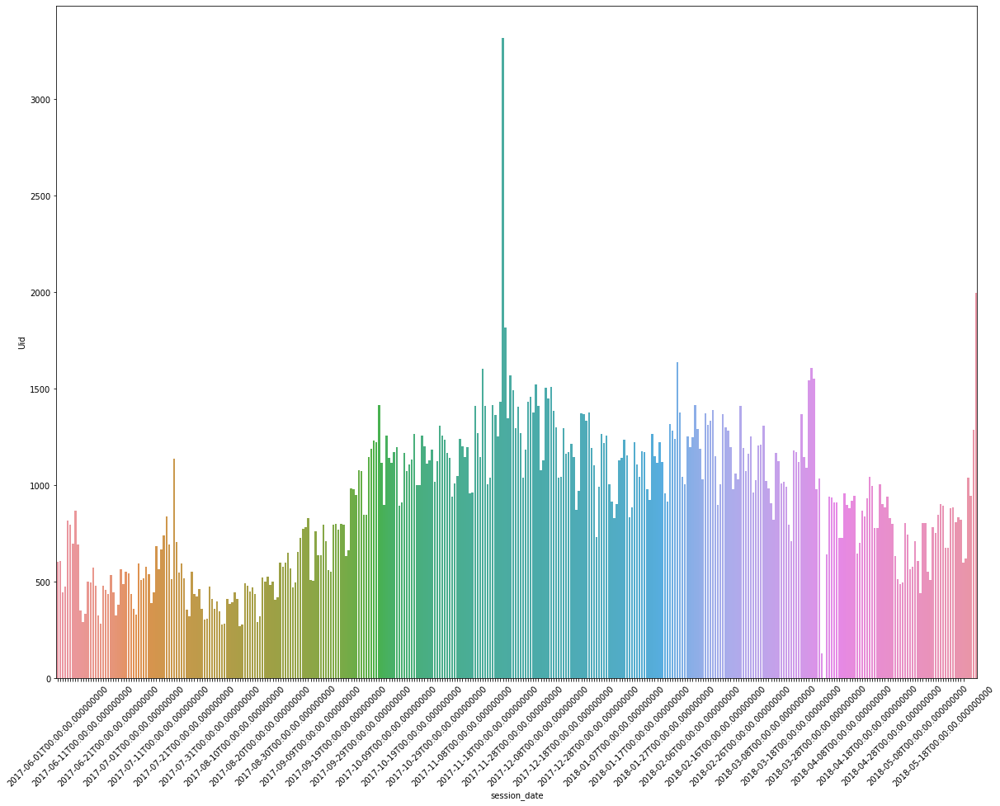

In [26]:
plt.figure(figsize=(20,15))
ax = sns.barplot(x="session_date", y="Uid", data=dau_total)
ax.set_xticks(range(len(dau_total)-5))
plt.xticks(rotation=45)
for ind, label in enumerate(ax.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)
plt.show()

In [27]:
dau_total_device = visits.pivot_table(
  index='session_date',
  columns='Device',
  values='Uid',
  aggfunc='nunique')

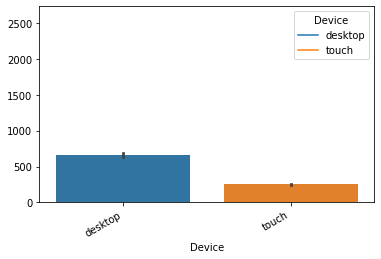

In [28]:
dau_total_device.plot()

ax = sns.barplot(data=dau_total_device)

In [29]:
dau_median = (
    visits.groupby(['session_date'])
    .agg({'Uid': 'nunique'})
    .median())

dau_median


Uid    921.0
dtype: float64

In [30]:
dau_avg = (
    visits.groupby(['session_date'])
    .agg({'Uid': 'nunique'})
    .mean())

dau_avg

Uid    907.991758
dtype: float64

In [31]:
wau_total = visits.groupby(['session_year', 'session_week']).agg({'Uid': 'nunique'}).reset_index()
dau_total.columns = ['session_year','session_week']

wau_total.head()

,session_year,session_week,Uid
0,2017-01-01,2017-06-01,4082
1,2017-01-01,2017-06-08,3311
2,2017-01-01,2017-06-15,2844
3,2017-01-01,2017-06-22,3079
4,2017-01-01,2017-06-29,3055


***The weekly timeframe graphs below supplement the analysis for daily usage only insofar as usage abruply decreases during the last week of December, conceivably because of the imminency of New Year's.*** 

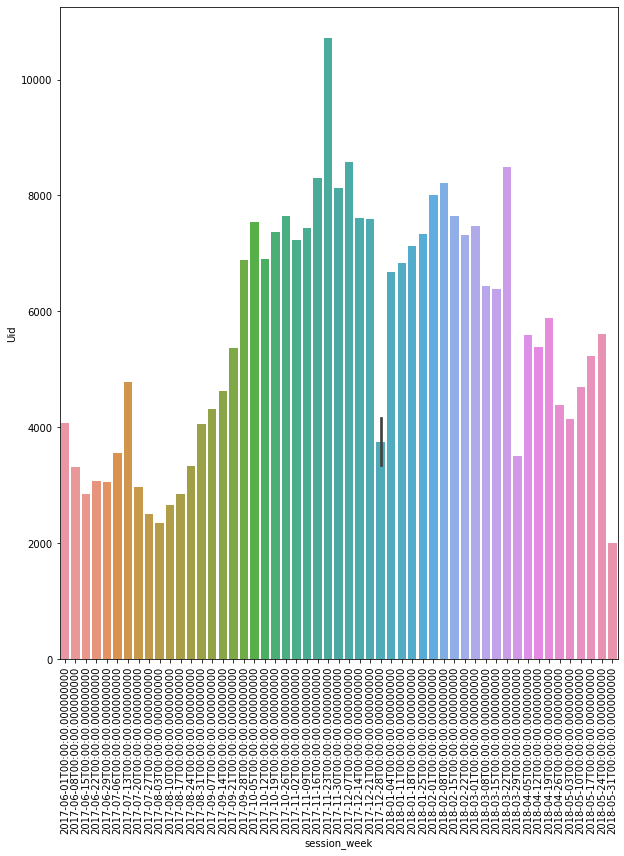

In [32]:
plt.figure(figsize=(10,12))
ax = sns.barplot(x="session_week", y="Uid", data=wau_total)
plt.xticks(rotation=90)
plt.show()

In [33]:
fig = px.line(wau_total,x="session_week", y="Uid",title='WAU')
#adding reference line with average DAU over time
fig.add_hline(y=wau_total['Uid'].mean(),line_dash="dash", line_color="purple", annotation_text="average WAU",
             annotation_position="top left")
fig.show()

In [34]:
wau_median = visits.groupby(['session_year', 'session_week']).agg({'Uid': 'nunique'}).median()

wau_median

Uid    5599.5
dtype: float64

In [35]:
wau_avg = visits.groupby(['session_week']).agg({'Uid': 'nunique'}).mean()

wau_avg

Uid    5724.415094
dtype: float64

In [36]:
mau_total = (
    visits.groupby(['session_month'])
    .agg({'Uid': 'nunique'})
    
).reset_index()
mau_total.columns = ['session_month', 'Uid']

mau_total

,session_month,Uid
0,2017-06-01,13259
1,2017-07-01,14183
2,2017-08-01,11631
3,2017-09-01,18975
4,2017-10-01,29692
5,2017-11-01,32797
6,2017-12-01,31557
7,2018-01-01,28716
8,2018-02-01,28749
9,2018-03-01,27473


In [37]:
import warnings 
warnings.filterwarnings('ignore')
mau_total.mean()

Uid    23228.416667
dtype: float64

In [38]:

mau_total.median()

Uid    24240.5
dtype: float64

***Here, the aggragated data in the monthly plots below may provide a reason to believe that capital invested in marketing has yielded a sizable return because the usage in the Q1-Q2 of 2018 is about 1.5x - 2x the amount of users during Q3 2017.***

In [39]:
fig = px.line(mau_total,x="session_month", y="Uid",title='MAU')
#adding reference line with average DAU over time
fig.add_hline(y=mau_total['Uid'].mean(),line_dash="dash", line_color="purple", annotation_text="average MAU",
             annotation_position="top left")
fig.show()

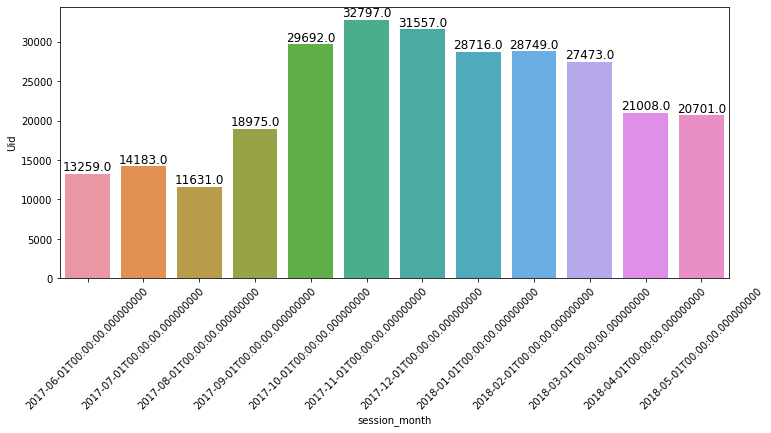

In [40]:
plt.figure(figsize=(12,5))
ax = sns.barplot(x="session_month", y="Uid", data=mau_total)
for i, val in enumerate(mau_total['Uid'].values):
    plt.text(i, val, float(val), horizontalalignment='center', verticalalignment='bottom', fontdict={'fontweight':500, 'size':12})
    plt.xticks(rotation=45)
#for index, row in mau_total.iterrows():
    #ax.text(row.name,row.Uid, round(row.Uid,2), color='black', ha="center")
plt.show()



In [41]:
mau_median = (
    visits.groupby(['session_year', 'session_month'])
    .agg({'Uid': 'nunique'})
    .median()
)
mau_median

Uid    24240.5
dtype: float64

In [42]:
mau_avg = (
    visits.groupby(['session_year', 'session_month'])
    .agg({'Uid': 'nunique'})
    .mean()
)

mau_avg

Uid    23228.416667
dtype: float64

#### How many sessions are there per day?  ####

***Generally, the trend in usage indicates that users were more active during the end of Q3 and Q4, which  correpsonds to an overall higher click-through rate during these periods, circumscribed by the range of 1.5 - 1.9 sessions per user. Conversely, lower user/session ratios tend to correlate with overall lower usage of "Afisha."***   

In [43]:
orders

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


In [44]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-01-01,2017-12-01,2017-12-21,2017-12-27


In [45]:
dau_new=visits.groupby(visits['session_date'])['Uid','Start Ts'].nunique().reset_index()
dau_new['sessions_per_user']=(dau_new['Uid']/dau_new['Start Ts'])
dau_new.head()

,session_date,Uid,Start Ts,sessions_per_user
0,2017-06-01,605,491,1.232179
1,2017-06-02,608,494,1.230769
2,2017-06-03,445,382,1.164921
3,2017-06-04,476,413,1.152542
4,2017-06-05,820,605,1.355372


In [46]:
dau_new.sessions_per_user.describe()

count    364.000000
mean       1.419483
std        0.221690
min        1.000000
25%        1.241090
50%        1.413311
75%        1.569603
max        3.194418
Name: sessions_per_user, dtype: float64

In [47]:

fig = px.line(dau_new,
              x="session_date", y="sessions_per_user",title='Sessions per user',
               )
fig.show()

In [48]:

fig = px.line(dau_new,
              x="session_date", y="Start Ts",title='Total Sessions per Day',
               )
fig.show()

**Virtually all users have one session per day using the platform.**

In [49]:
user_session_day_pivot = visits.pivot_table(
    index='session_date',
    columns= 'End Ts',
    values='Uid',
    aggfunc='count'
).reset_index


<AxesSubplot:>

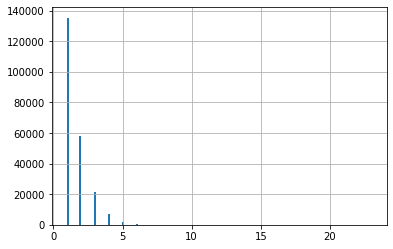

In [50]:
user_session_count = visits.groupby(visits['End Ts'])['Uid'].count()
#
#user_session_count.plot()
#
#fig = px.bar(user_session_count, y='Uid', x='End Ts',
#            title="Default: various text sizes, positions and angles")
#fig.show()
#
user_session_count.hist(bins=150)

In [51]:
user_session_count

End Ts
2017-06-01 00:02:00    2
2017-06-01 00:04:00    1
2017-06-01 00:11:00    1
2017-06-01 00:16:00    1
2017-06-01 00:25:00    1
                      ..
2018-06-01 00:11:00    1
2018-06-01 00:12:00    1
2018-06-01 00:13:00    2
2018-06-01 00:25:00    1
2018-06-01 01:26:00    1
Name: Uid, Length: 224760, dtype: int64

In [52]:
user_session_count.unique()

array([ 2,  1,  4,  3,  5,  7,  6,  8,  9, 12, 10, 11, 13, 14, 15, 18, 23,
       21])

In [53]:
orders


,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


In [54]:
sessions_per_user_M = visits.groupby(['session_year', 'session_month']).agg(
    {'Uid': ['count', 'nunique']}
)
sessions_per_user_M.columns = ['n_sessions', 'n_users']
sessions_per_user_M['sessions_per_user'] = (
    sessions_per_user_M['n_sessions'] / sessions_per_user_M['n_users']
)

sessions_per_user_M

n_sessions  n_users  sessions_per_user
session_year session_month                                        
2017-01-01   2017-06-01          16505    13259           1.244815
             2017-07-01          17828    14183           1.256998
             2017-08-01          14355    11631           1.234202
             2017-09-01          23907    18975           1.259921
             2017-10-01          37903    29692           1.276539
             2017-11-01          43969    32797           1.340641
             2017-12-01          41983    31557           1.330386
2018-01-01   2018-01-01          36939    28716           1.286356
             2018-02-01          37182    28749           1.293332
             2018-03-01          35679    27473           1.298693
             2018-04-01          26515    21008           1.262138
             2018-05-01          26635    20701           1.286653

**User Sessions Per Month  by Year**

***Here, the the "user per session" ratio  aggragated on the monthly timeframe likely confirms the trend in usage is subject to holiday cyclicality; that is, peaks and troughs in usage coincide with major sociocultural shifts in consumer behavior during the summer months, and the holdiay season.***  

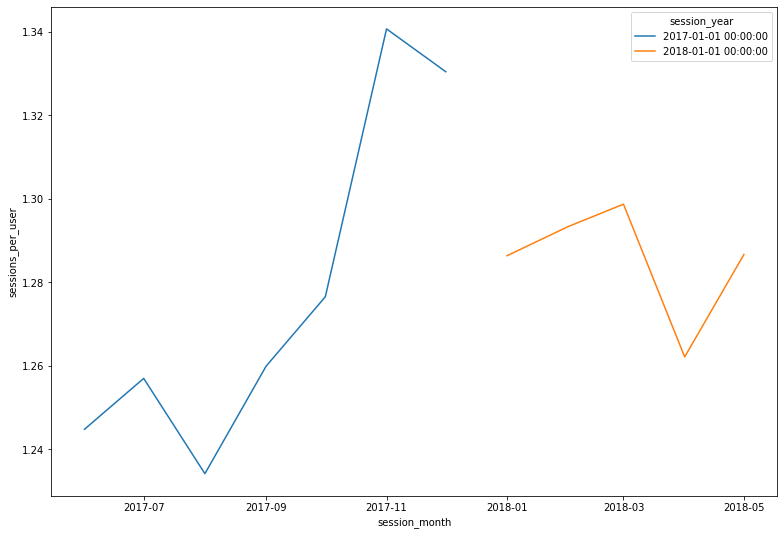

In [55]:
plt.figure(figsize=(13, 9))
sns.lineplot(data=sessions_per_user_M, x="session_month", y="sessions_per_user", hue="session_year")
plt.show()




In [56]:
dau_total_sessions_md = (
    visits.groupby(['session_date'])
    .agg({'Uid': 'count'})).median()

dau_total_sessions_md

Uid    1003.0
dtype: float64

In [57]:
dau_total_sessions_avg = (
    visits.groupby(['session_date'])
    .agg({'Uid': 'count'})).mean()

dau_total_sessions_avg

Uid    987.362637
dtype: float64

#### What is the length of each session on Yandex.Afisha? ####

***Here, there are about 170000 session with the median session duration of 300 seconds, which is 5 minutes. There are 190000 sessions with a duration less than or equal to 300 seconds. The outliers of 80000 seconds, the equivalent of  22 hours, 40000 seconds, which is 11 hours, 5000 seconds / 83 minutes, are likely not plausible session durations in which users are actually engaging the platform, and may be due to users leaving devices idling without a screensaver and not interacting therewith. Moreover, generally,desktop computers user sessions are evidenced by longer session times, which tends to show that capital invested in advertising and UX design for the desktop version of Afisha  may have a higher ROI. On the other hand, further analysis would be required to determine whether the corresponding conversion rates would justify this proposition.*** 

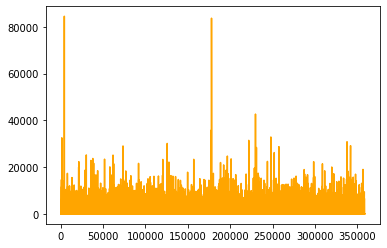

In [58]:
visits['session_duration_sec'] = (
    visits['End Ts'] - visits['Start Ts']
).dt.seconds
visits['session_duration_sec'].plot(color='orange')
plt.show()

In [59]:
visits.query('session_duration_sec > 5000')

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec
201,desktop,2017-06-29 12:19:00,2,2017-06-29 10:40:00,13888745432979765063,2017-01-01,2017-06-01,2017-06-29,2017-06-29,5940
474,desktop,2017-11-15 12:45:00,2,2017-11-15 11:03:00,17649287249444736221,2017-01-01,2017-11-01,2017-11-09,2017-11-15,6120
674,desktop,2017-07-19 19:43:00,1,2017-07-19 18:13:00,9534697107484505257,2017-01-01,2017-07-01,2017-07-13,2017-07-19,5400
760,desktop,2017-11-24 16:34:00,3,2017-11-24 12:30:00,4011112376118593718,2017-01-01,2017-11-01,2017-11-23,2017-11-24,14640
802,desktop,2017-11-20 22:28:00,3,2017-11-20 20:59:00,18422203423383463941,2017-01-01,2017-11-01,2017-11-16,2017-11-20,5340
...,...,...,...,...,...,...,...,...,...,...
357680,touch,2017-08-31 16:31:00,4,2017-08-31 14:45:00,1029211097841826939,2017-01-01,2017-08-01,2017-08-31,2017-08-31,6360
357701,desktop,2017-11-28 16:17:00,1,2017-11-28 14:33:00,11402565573329395669,2017-01-01,2017-11-01,2017-11-23,2017-11-28,6240
358399,desktop,2017-07-20 20:08:00,1,2017-07-20 17:31:00,9534697107484505257,2017-01-01,2017-07-01,2017-07-20,2017-07-20,9420
358433,touch,2017-12-17 16:56:00,2,2017-12-17 15:09:00,11668998529606949896,2017-01-01,2017-12-01,2017-12-14,2017-12-17,6420


In [60]:
visits.query('session_duration_sec == 300')

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018-01-01,2018-02-01,2018-02-01,2018-02-06,300
23,touch,2017-12-26 17:35:00,4,2017-12-26 17:30:00,11451610027598174149,2017-01-01,2017-12-01,2017-12-21,2017-12-26,300
134,touch,2017-11-13 21:50:00,4,2017-11-13 21:45:00,13307249193982123708,2017-01-01,2017-11-01,2017-11-09,2017-11-13,300
161,desktop,2018-04-05 20:54:00,4,2018-04-05 20:49:00,1099974364848578345,2018-01-01,2018-04-01,2018-04-05,2018-04-05,300
194,desktop,2017-11-16 12:04:00,3,2017-11-16 11:59:00,11495209473693229030,2017-01-01,2017-11-01,2017-11-16,2017-11-16,300
...,...,...,...,...,...,...,...,...,...,...
358410,desktop,2018-02-22 16:19:00,1,2018-02-22 16:14:00,3263486045884611639,2018-01-01,2018-02-01,2018-02-22,2018-02-22,300
358427,desktop,2017-10-21 18:50:00,4,2017-10-21 18:45:00,8775353501344427563,2017-01-01,2017-10-01,2017-10-19,2017-10-21,300
358449,touch,2017-12-18 01:03:00,4,2017-12-18 00:58:00,3089328216811650299,2017-01-01,2017-12-01,2017-12-14,2017-12-18,300
358450,desktop,2017-11-12 17:05:00,5,2017-11-12 17:00:00,15929924958876715522,2017-01-01,2017-11-01,2017-11-09,2017-11-12,300


In [61]:
visits.query('session_duration_sec == 5000')

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec


In [62]:
nil_2000_duration = visits.query('0 < session_duration_sec <= 2000')

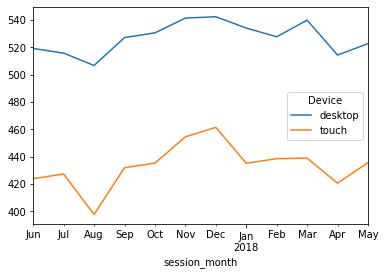

In [63]:
duration_device = nil_2000_duration.pivot_table(index='session_month',
                  columns='Device',
                  values='session_duration_sec',
                  aggfunc='mean')

duration_device.plot()
plt.show()

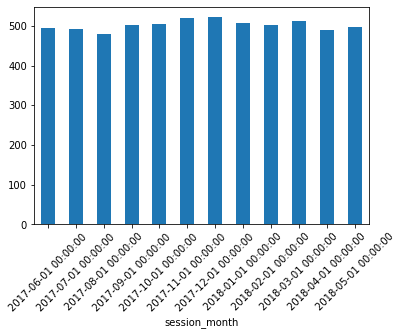

In [64]:
duration_total = nil_2000_duration.groupby('session_month')['session_duration_sec'].mean()
duration_total.plot(kind='bar')
plt.xticks(rotation=45)

plt.show()



***In total, the mean duration spent per month is 500 seconds per user, which is about 8 minutes. The disparities between device type are evidenced by somewhat lower usage duration by "touch" devices than desktops, which comports with one's intuitions because "touch devices," arguably, are meant for facilitating quicker web access and transactions; whereas, desktops, as stationary devices, are likely used when one is in less of a hurry, relatively speaking.*** 

In [65]:
visits['session_duration_sec'].describe()

count    359400.000000
mean        643.506489
std        1016.334786
min           0.000000
25%         120.000000
50%         300.000000
75%         840.000000
max       84480.000000
Name: session_duration_sec, dtype: float64

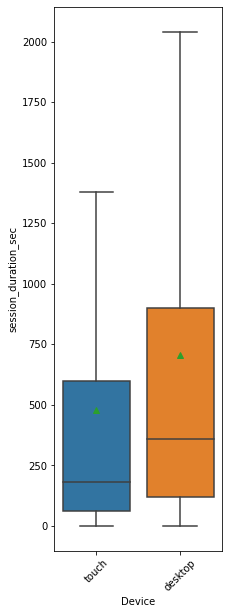

In [66]:
plt.figure(figsize = (3,10))
sns.boxplot(x=visits.Device, y = visits['session_duration_sec'], showmeans=True, data=visits, showfliers=False)
plt.xticks(rotation=45)
plt.show()

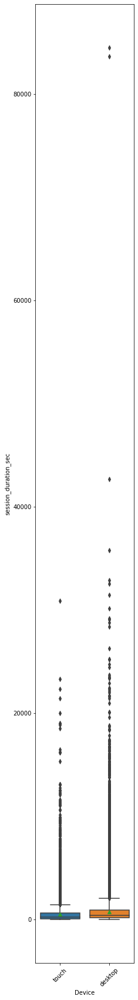

In [67]:
plt.figure(figsize = (3,30))
sns.boxplot(x=visits.Device, y = visits['session_duration_sec'], showmeans=True, data=visits, showfliers=True)
plt.xticks(rotation=45)
plt.show()

***Here, as in the line plot in the begining of the section, the durations separted by device indicate that desktop platform usage is slightly longer than "touch." However,  the outliers of 80000 seconds, the equivalent of  22 hours, 40000 seconds, which is 11 hours, 5000 seconds / 83 minutes, are likely not plausible session durations in which users are actually engaging the platform, and may be due to users leaving desktop idling without a screensaver and not interacting therewith, and a similar phenomenon may be affecting "touch: device usage. Moreover, generally, desktop computers user sessions are evidenced by longer session times, which tends to show that capital invested in advertising and UX design for the desktop version of Afisha  will likely have a higher ROI.*** 

#### What's the user retention rate? ####

***The cohorts at the end of Q3 2017 and Q4 2017 have the highest retention rates overall, which evidences the general trend of higher usage during the holiday season.*** 

In [70]:
orders


,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


In [71]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-01-01,2017-12-01,2017-12-21,2017-12-27,0


In [76]:
min_visit=visits.groupby(['Uid'])['Start Ts'].min().reset_index()
min_visit.columns = ['Uid', 'first_session']
min_visit.head()

,Uid,first_session
0,11863502262781,2018-03-01 17:27:00
1,49537067089222,2018-02-06 15:55:00
2,297729379853735,2017-06-07 18:47:00
3,313578113262317,2017-09-18 22:49:00
4,325320750514679,2017-09-30 14:29:00


In [77]:
visits=visits.merge(min_visit, how='inner',on='Uid')
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,2018-02-19 16:53:00
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,2018-03-09 20:05:00
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,2018-03-09 20:05:00


In [78]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359400 entries, 0 to 359399
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Device                359400 non-null  object        
 1   End Ts                359400 non-null  datetime64[ns]
 2   Source Id             359400 non-null  int64         
 3   Start Ts              359400 non-null  datetime64[ns]
 4   Uid                   359400 non-null  uint64        
 5   session_year          359400 non-null  datetime64[ns]
 6   session_month         359400 non-null  datetime64[ns]
 7   session_week          359400 non-null  datetime64[ns]
 8   session_date          359400 non-null  datetime64[ns]
 9   session_duration_sec  359400 non-null  int64         
 10  first_session         359400 non-null  datetime64[ns]
dtypes: datetime64[ns](7), int64(2), object(1), uint64(1)
memory usage: 32.9+ MB


In [79]:
visits['month'] = visits['first_session'].astype('datetime64[M]')
visits['age'] = ((pd.to_datetime(visits['Start Ts']) - pd.to_datetime(visits['first_session'])) / np.timedelta64(1,'M'))\
                                                                       .round().astype('int')
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session,month,age
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,2017-12-20 17:20:00,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,2018-02-19 16:53:00,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,2018-03-09 20:05:00,2018-03-01,2
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,2018-03-09 20:05:00,2018-03-01,0


In [80]:
cohorts = visits.pivot_table(index='month',
                 columns='age',
                  values='Uid',
                  aggfunc='nunique').fillna(0)

cohorts

age,0,1,2,3,4,5,6,7,8,9,10,11,12
month,,,,,,,,,,,,,
2017-06-01,13259.0,986.0,710.0,813.0,921.0,880.0,847.0,740.0,743.0,661.0,550.0,526.0,176.0
2017-07-01,13140.0,747.0,680.0,705.0,743.0,640.0,591.0,645.0,489.0,383.0,321.0,71.0,0.0
2017-08-01,10181.0,705.0,629.0,602.0,522.0,426.0,423.0,345.0,297.0,234.0,33.0,0.0,0.0
2017-09-01,16704.0,1278.0,1110.0,826.0,669.0,663.0,554.0,429.0,334.0,43.0,0.0,0.0,0.0
2017-10-01,25977.0,1911.0,1367.0,996.0,949.0,808.0,549.0,464.0,85.0,0.0,0.0,0.0,0.0
2017-11-01,27248.0,1894.0,1260.0,1058.0,861.0,655.0,506.0,72.0,0.0,0.0,0.0,0.0,0.0
2017-12-01,25268.0,1300.0,1034.0,735.0,546.0,409.0,70.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-01-01,22624.0,1219.0,812.0,584.0,389.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-02-01,22197.0,1070.0,590.0,403.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
retention=cohorts.iloc[:,0:].div(cohorts[0], axis=0)

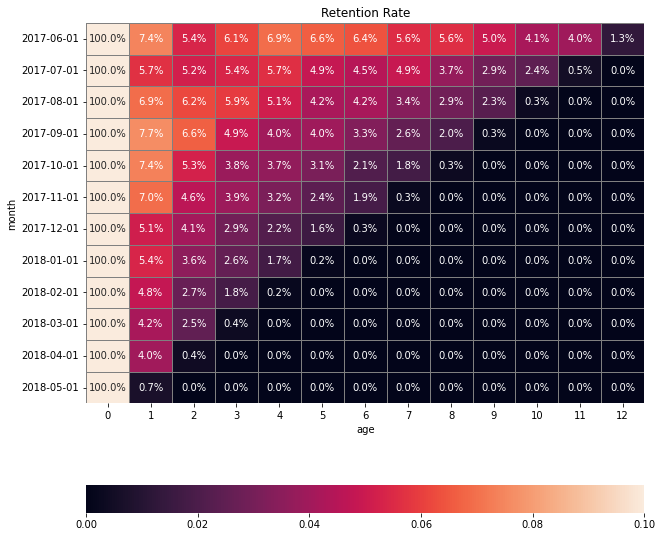

In [82]:
fig, ax = plt.subplots(figsize=(10,10))
retention.index=retention.index.astype(str)
sns.heatmap(retention, annot=True, fmt='.1%', linewidths=1, linecolor='grey',  vmax=0.1, cbar_kws= {'orientation': 'horizontal'} 
            ).set(title = 'Retention Rate')
plt.show()

***In analyzing the 'visits' datatframe the retention rate progressibely declines from June 2017. If retention is predicated on the "orders" dataframe, then end of Q3 2017 and Q4 2017 have the highest retention rates overall, which evidences the general trend of higher usage during the holiday season.*** 

### Sales - Cohort KPI Analysis ###

In [83]:
orders['session_year'] = orders['Buy Ts'].astype('datetime64[Y]')

orders['session_month'] = orders['Buy Ts'].astype('datetime64[M]')

orders['session_week'] = orders['Buy Ts'].astype('datetime64[W]')

orders['session_date'] = orders['Buy Ts'].astype('datetime64[D]')







#### Conversion ####

***36898 users made a purchase with a month of their initial visit. The third quartile duration is one month with 3083 users. The overall conversion rate is 79.4%.***

In [84]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [85]:
orders.dtypes

Buy Ts           datetime64[ns]
Revenue                 float64
Uid                      uint64
session_year     datetime64[ns]
session_month    datetime64[ns]
session_week     datetime64[ns]
session_date     datetime64[ns]
dtype: object

In [86]:
orders['Buy Ts'].describe()

count                   50415
unique                  45991
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-06-01 00:02:00
Name: Buy Ts, dtype: object

In [87]:
first_purchase_dates = orders.groupby(['Uid'])["Buy Ts"].min().reset_index().rename(columns={"Buy Ts":"first_order_date"})
                                               #.agg({"Buy Ts":["min"]}).stack().reset_index().rename(columns={"Buy Ts":"first_order_date"})

In [88]:
orders = orders.merge(first_purchase_dates, how='left', on=['Uid'])

#.drop(['first_order_date_x', 'first_order_date_y', 'first_visit_month_x', 'first_visit_month_y' ],axis=1)

In [89]:
first_purchase_dates.head()

,Uid,first_order_date
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00


In [91]:
orders['first_order_month'] =  orders['first_order_date'].astype('datetime64[M]')

In [92]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01
...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01


In [94]:
orders['first order month']= orders['first_order_date'].astype('datetime64[M]')

In [95]:
orders['month'] = orders['Buy Ts'].astype('datetime64[M]')

In [96]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01


In [97]:
first_purchase_dates.head()

,Uid,first_order_date
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00


In [99]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01


In [100]:
first_purchase_dates

,Uid,first_order_date
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00
...,...,...
36518,18445147675727495770,2017-11-24 09:03:00
36519,18445407535914413204,2017-09-22 23:55:00
36520,18445601152732270159,2018-03-26 22:54:00
36521,18446156210226471712,2018-02-18 19:34:00


#### **Calculation for Average Conversion Time** ####

In [101]:
visits.head()


,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session,month,age
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,2017-12-20 17:20:00,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,2018-02-19 16:53:00,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,2018-03-09 20:05:00,2018-03-01,2
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,2018-03-09 20:05:00,2018-03-01,0


In [102]:
first_visit_month = visits.groupby(['Uid']).agg({"Start Ts":["min"]}).stack().reset_index().rename(columns={"Start Ts":"first_visit"})
first_visit_month.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228169 entries, 0 to 228168
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Uid          228169 non-null  uint64        
 1   level_1      228169 non-null  object        
 2   first_visit  228169 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(1), uint64(1)
memory usage: 5.2+ MB


In [103]:
first_visit_month['first_visit_month'] = first_visit_month['first_visit'].astype('datetime64[M]')

In [104]:
orders = orders.merge(first_visit_month, how='left', on='Uid')
#.drop(['first_order_date_x', 'first_order_date_y'],axis=1)
#'first_visit_x', 'first_visit_y', 

In [105]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01,min,2017-10-23 12:32:00,2017-10-01


In [106]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50415 entries, 0 to 50414
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Buy Ts             50415 non-null  datetime64[ns]
 1   Revenue            50415 non-null  float64       
 2   Uid                50415 non-null  uint64        
 3   session_year       50415 non-null  datetime64[ns]
 4   session_month      50415 non-null  datetime64[ns]
 5   session_week       50415 non-null  datetime64[ns]
 6   session_date       50415 non-null  datetime64[ns]
 7   first_order_date   50415 non-null  datetime64[ns]
 8   first_order_month  50415 non-null  datetime64[ns]
 9   first order month  50415 non-null  datetime64[ns]
 10  month              50415 non-null  datetime64[ns]
 11  level_1            50415 non-null  object        
 12  first_visit        50415 non-null  datetime64[ns]
 13  first_visit_month  50415 non-null  datetime64[ns]
dtypes: dat

In [107]:
orders['conversion']=((pd.to_datetime(orders['Buy Ts']) - pd.to_datetime(orders['first order month'])
                         )/np.timedelta64(1,'M')).astype('int')

In [108]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01,1
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01,1
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01,1
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01,min,2017-10-23 12:32:00,2017-10-01,1


In [109]:
orders['conversion'].describe()

count    50415.000000
mean         0.643618
std          1.718033
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         11.000000
Name: conversion, dtype: float64

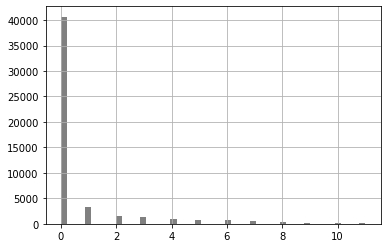

In [110]:
orders['conversion'].hist(bins=50,color='grey')
plt.show()

<AxesSubplot:>

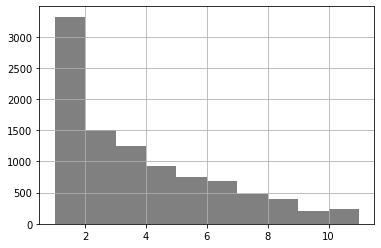

In [111]:
orders.query('conversion >= 1').conversion.hist(color='grey')

In [112]:
orders['conversion'].value_counts()

0     40665
1      3324
2      1504
3      1243
4       934
5       746
6       681
7       473
8       400
9       210
10      151
11       84
Name: conversion, dtype: int64

In [113]:
orders['conversion'].describe()

count    50415.000000
mean         0.643618
std          1.718033
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         11.000000
Name: conversion, dtype: float64

#### **Conversion Duration Visualization** ####

In [114]:
len(orders.query('1 < conversion > 7'))

845

In [115]:
len(orders.query('6 < conversion'))

1318

***36898 users made a purchase with a month of their initial visit. The third quartile duration is one month with 3083 users. Furthermore, 1512 users completed their purchases between 2-6 months, and 2309 users took 7-11 months.  The overall conversion rate is 79.4%.***

In [116]:
orders.query('conversion == 0')

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49943,2018-05-31 10:28:00,2.32,12279190092547408112,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 10:28:00,2018-05-01,2018-05-01,2018-05-01,min,2018-01-22 11:40:00,2018-01-01,0
49944,2018-05-31 10:28:00,1.17,9923164302297319826,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 10:28:00,2018-05-01,2018-05-01,2018-05-01,min,2017-12-14 22:30:00,2017-12-01,0
49945,2018-05-31 10:29:00,11.00,16764923360993571578,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 10:29:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 08:06:00,2018-05-01,0
49946,2018-05-31 10:29:00,6.60,10539822438259577232,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 10:29:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:44:00,2018-05-01,0


In [117]:
orders.query('conversion == 1')

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
2384,2017-07-01 14:15:00,1.22,3577449367987547907,2017-01-01,2017-07-01,2017-06-29,2017-07-01,2017-06-09 10:43:00,2017-06-01,2017-06-01,2017-07-01,min,2017-06-09 10:40:00,2017-06-01,1
2386,2017-07-01 14:52:00,3.67,3644482766749211722,2017-01-01,2017-07-01,2017-06-29,2017-07-01,2017-06-01 09:22:00,2017-06-01,2017-06-01,2017-07-01,min,2017-06-01 09:22:00,2017-06-01,1
2392,2017-07-01 16:58:00,1.22,16581423975138219023,2017-01-01,2017-07-01,2017-06-29,2017-07-01,2017-06-29 23:27:00,2017-06-01,2017-06-01,2017-07-01,min,2017-06-29 23:15:00,2017-06-01,1
2414,2017-07-02 10:43:00,4.40,13975932056717210136,2017-01-01,2017-07-01,2017-06-29,2017-07-02,2017-06-05 16:08:00,2017-06-01,2017-06-01,2017-07-01,min,2017-06-05 15:16:00,2017-06-01,1
2417,2017-07-02 11:42:00,8.55,13888745432979765063,2017-01-01,2017-07-01,2017-06-29,2017-07-02,2017-06-05 11:39:00,2017-06-01,2017-06-01,2017-07-01,min,2017-06-05 11:22:00,2017-06-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50409,2018-05-31 23:43:00,3.67,1805512004303848280,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:43:00,2018-05-01,2018-05-01,2018-05-01,min,2017-12-07 23:20:00,2017-12-01,1
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01,1
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01,1
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01,1


In [118]:
orders['conversion'].median()

0.0

In [119]:
print('The overall conversion is {:.1%}'.format(orders['Uid'].nunique()/orders['Buy Ts'].nunique()))

The overall conversion is 79.4%


#### **Number of Unique User Orders per Month by Cohort** ####

In [120]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0


In [121]:
cohort_sizes = orders.groupby(['first order month']).agg({'Uid': 'nunique'})
cohort_sizes.columns = ['n_buyers']
cohort_sizes.head() 

,n_buyers
first order month,
2017-06-01,2023
2017-07-01,1923
2017-08-01,1370
2017-09-01,2581
2017-10-01,4340


In [123]:
cohort_sizes.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13 entries, 2017-06-01 to 2018-06-01
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   n_buyers  13 non-null     int64
dtypes: int64(1)
memory usage: 208.0 bytes


In [124]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0


In [125]:
cohort=orders.groupby(['first_order_month', 'month'])['Buy Ts'].count().reset_index()

In [126]:
cohort.columns=['first order month','month','orders']
cohort

,first order month,month,orders
0,2017-06-01,2017-06-01,2354
1,2017-06-01,2017-07-01,177
2,2017-06-01,2017-08-01,174
3,2017-06-01,2017-09-01,226
4,2017-06-01,2017-10-01,292
...,...,...,...
74,2018-03-01,2018-05-01,176
75,2018-04-01,2018-04-01,2495
76,2018-04-01,2018-05-01,195
77,2018-05-01,2018-05-01,3249


In [127]:
cohort_sizes.head()

,n_buyers
first order month,
2017-06-01,2023
2017-07-01,1923
2017-08-01,1370
2017-09-01,2581
2017-10-01,4340


In [128]:
#merge cohort with cohort size
cohort=cohort.merge(cohort_sizes,on=['first order month'])
#.drop(['n_buyers_x', 'n_buyers_y'],axis=1)
cohort.head()

,first order month,month,orders,n_buyers
0,2017-06-01,2017-06-01,2354,2023
1,2017-06-01,2017-07-01,177,2023
2,2017-06-01,2017-08-01,174,2023
3,2017-06-01,2017-09-01,226,2023
4,2017-06-01,2017-10-01,292,2023


In [129]:
cohort.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79 entries, 0 to 78
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   first order month  79 non-null     datetime64[ns]
 1   month              79 non-null     datetime64[ns]
 2   orders             79 non-null     int64         
 3   n_buyers           79 non-null     int64         
dtypes: datetime64[ns](2), int64(2)
memory usage: 3.1 KB


In [130]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01,1
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01,1
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01,1
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01,min,2017-10-23 12:32:00,2017-10-01,1


In [131]:
cohort.head()

,first order month,month,orders,n_buyers
0,2017-06-01,2017-06-01,2354,2023
1,2017-06-01,2017-07-01,177,2023
2,2017-06-01,2017-08-01,174,2023
3,2017-06-01,2017-09-01,226,2023
4,2017-06-01,2017-10-01,292,2023


In [132]:
cohort['age_month'] = ((cohort['month'] - cohort['first order month']) / np.timedelta64(1,'M')).round()
cohort['orders_per_buyer']=cohort['orders']/cohort['n_buyers']
cohort.head()

,first order month,month,orders,n_buyers,age_month,orders_per_buyer
0,2017-06-01,2017-06-01,2354,2023,0.0,1.163618
1,2017-06-01,2017-07-01,177,2023,1.0,0.087494
2,2017-06-01,2017-08-01,174,2023,2.0,0.086011
3,2017-06-01,2017-09-01,226,2023,3.0,0.111715
4,2017-06-01,2017-10-01,292,2023,4.0,0.144340


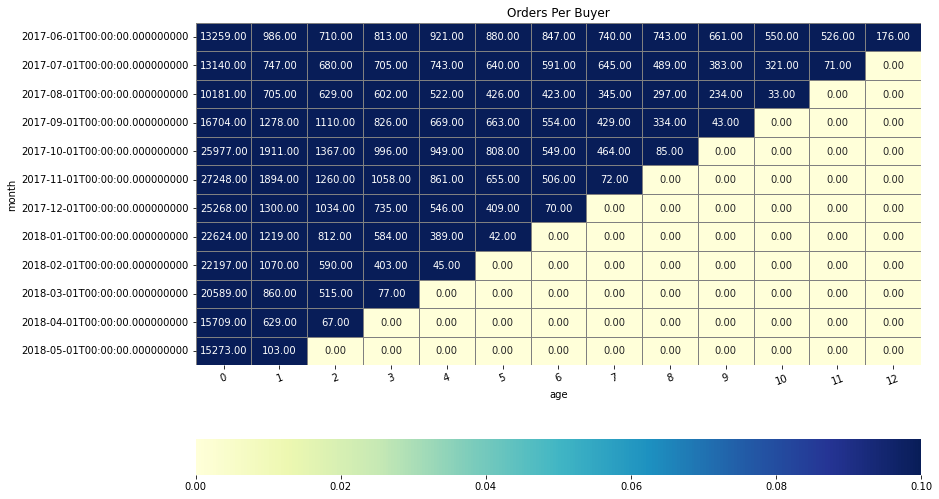

In [133]:
plt.figure(figsize=(13, 9))
sns.heatmap(cohorts, annot=True, fmt='.2f', linewidths=1, linecolor='grey',  vmax=0.1, cbar_kws= {'orientation': 'horizontal'} 
            , cmap="YlGnBu").set(title = 'Orders Per Buyer')
plt.xticks(rotation=20)
plt.show()

In [134]:
cohort.groupby(['first order month']).agg({'orders':'sum'})

,orders
first order month,
2017-06-01,4438
2017-07-01,2910
2017-08-01,2188
2017-09-01,3878
2017-10-01,6005
2017-11-01,5900
2017-12-01,5894
2018-01-01,4308
2018-02-01,4470


In [135]:
cohort_sizes

,n_buyers
first order month,
2017-06-01,2023
2017-07-01,1923
2017-08-01,1370
2017-09-01,2581
2017-10-01,4340
2017-11-01,4081
2017-12-01,4383
2018-01-01,3373
2018-02-01,3651


***The foregoing heatmap indicates that the initial cohort examined in this dataset has the highest number of orders per user. Generally, the lower number of buyers, the higher the ratio; howvever, the September 2017 cohort, which has about the same number of buyers as the June cohort, has a lower ratio, which is evidenced by less purchases. Still, the orders per buyer metric tends to be inversely proportional with the number of buyers.***

***Users who made purchases during September and the entirety of Q4 2017, tended have a higher conversion rate during their first month of purchases, and subsequently tended have a higher conversion rate in the succeeding months, which shows the value of cohorts during this time of the year.*** 

#### **Average Purchase Size** ####

***The median purcahse size is 2.56.***

In [136]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0


In [137]:
avg_cohort=orders.groupby(['first order month','month'])['Revenue'].median().reset_index()

In [138]:
avg_cohort.head()

,first order month,month,Revenue
0,2017-06-01,2017-06-01,2.44
1,2017-06-01,2017-07-01,3.60
2,2017-06-01,2017-08-01,3.05
3,2017-06-01,2017-09-01,4.28
4,2017-06-01,2017-10-01,3.30


In [139]:
avg_cohort['age_month'] = ((avg_cohort['month'] - avg_cohort['first order month']) / np.timedelta64(1,'M')).round()
avg_cohort

,first order month,month,Revenue,age_month
0,2017-06-01,2017-06-01,2.44,0.0
1,2017-06-01,2017-07-01,3.60,1.0
2,2017-06-01,2017-08-01,3.05,2.0
3,2017-06-01,2017-09-01,4.28,3.0
4,2017-06-01,2017-10-01,3.30,4.0
...,...,...,...,...
74,2018-03-01,2018-05-01,2.87,2.0
75,2018-04-01,2018-04-01,2.78,0.0
76,2018-04-01,2018-05-01,3.05,1.0
77,2018-05-01,2018-05-01,2.44,0.0


In [140]:
avg_cohort.Revenue.median()

2.93

In [141]:
avg_cohort_piv=avg_cohort.pivot_table(
    index='first order month', 
    columns='age_month', 
    values='Revenue', 
    aggfunc='mean'
)

avg_cohort_piv.round(2).fillna('')

age_month,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
first order month,,,,,,,,,,,,
2017-06-01,2.44,3.6,3.05,4.28,3.3,2.44,3.05,3.05,3.39,3.67,4.28,1.83
2017-07-01,3.05,2.81,3.85,3.05,2.38,2.44,2.44,3.58,2.26,4.64,3.67,
2017-08-01,2.75,3.79,3.67,4.28,4.58,3.67,3.05,3.05,4.73,3.42,,
2017-09-01,2.44,4.89,2.93,5.53,2.93,4.89,3.4,3.48,3.91,,,
2017-10-01,2.44,2.75,2.69,2.72,3.3,2.62,2.38,2.57,,,,
2017-11-01,2.44,1.95,1.83,3.18,2.09,2.44,3.12,,,,,
2017-12-01,2.66,2.41,2.96,3.05,2.36,2.44,,,,,,
2018-01-01,2.44,2.44,2.44,3.05,2.08,,,,,,,
2018-02-01,2.44,2.44,2.33,2.26,,,,,,,,


In [142]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01,1
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01,1
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01,1
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01,min,2017-10-23 12:32:00,2017-10-01,1


In [143]:
avg_check=orders.groupby(['Buy Ts'])['Revenue'].sum().reset_index()
fig = px.histogram(avg_check, x="Buy Ts", y='Revenue')
fig.show()

In [145]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01,1
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01,1
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01,1
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01,min,2017-10-23 12:32:00,2017-10-01,1


In [146]:
orders_day = orders.groupby(['session_date', 'Uid']).agg({'Buy Ts': 'count'}).reset_index()

In [147]:
orders_day.describe()

,Uid,Buy Ts
count,4.654800e+04,46548.000000
mean,9.133956e+18,1.083076
std,5.297317e+18,0.345233
min,3.135781e+14,1.000000
25%,4.555986e+18,1.000000
50%,9.156947e+18,1.000000
75%,1.372700e+19,1.000000
max,1.844617e+19,9.000000


In [148]:
orders_week = orders.groupby(['session_week', 'Uid']).agg({'Buy Ts': 'count'}).reset_index()

In [149]:
orders_week['Buy Ts'].describe()

count    43359.000000
mean         1.162734
std          0.722510
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         20.000000
Name: Buy Ts, dtype: float64

In [150]:
orders_week['Buy Ts'].value_counts()

1     39149
2      3099
3       547
4       204
5       121
6        75
7        40
8        31
9        26
10       23
11       17
12        8
13        8
15        6
17        2
14        1
19        1
20        1
Name: Buy Ts, dtype: int64

In [151]:
orders_month = orders.groupby(['session_month', 'Uid']).agg({'Buy Ts': 'count'}).reset_index()

In [152]:
orders_month['Buy Ts'].describe()

count    41019.000000
mean         1.229065
std          1.384665
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         67.000000
Name: Buy Ts, dtype: float64

In [153]:
orders_month['Buy Ts'].value_counts()

1     36303
2      3511
3       629
4       190
5        92
6        48
7        35
8        30
11       24
9        23
10       16
13       12
12       12
14       11
17       11
18        8
23        7
27        5
22        4
25        4
28        4
29        4
20        4
16        4
35        3
19        3
21        2
30        2
31        2
42        2
49        1
15        1
51        1
45        1
40        1
39        1
24        1
37        1
26        1
36        1
67        1
34        1
33        1
32        1
Name: Buy Ts, dtype: int64

In [154]:
orders_month['Buy Ts']

0        2
1        1
2        1
3        1
4        1
        ..
41014    1
41015    1
41016    1
41017    1
41018    1
Name: Buy Ts, Length: 41019, dtype: int64

In [155]:
orders_year= orders.groupby(['session_year', 'Uid']).agg({'Buy Ts': 'count'}).reset_index()

In [156]:
orders_year['Buy Ts'].describe()

count    38149.000000
mean         1.321529
std          2.675203
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max        182.000000
Name: Buy Ts, dtype: float64

In [157]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0


#### How much money do users bring? ####

In [158]:
cohort=orders.groupby(['first_order_month', 'month'])['Buy Ts'].count().reset_index()

In [159]:
revenue_grouped_by_cohorts = orders.groupby(
    ['first order month', 'month']
).agg({'Revenue': 'sum'}).reset_index()

revenue_grouped_by_cohorts

,first order month,month,Revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58
...,...,...,...
74,2018-03-01,2018-05-01,1114.87
75,2018-04-01,2018-04-01,10600.69
76,2018-04-01,2018-05-01,1209.92
77,2018-05-01,2018-05-01,13925.76


In [160]:
revenue_grouped_by_cohorts.dtypes

first order month    datetime64[ns]
month                datetime64[ns]
Revenue                     float64
dtype: object

In [161]:
revenue_grouped_by_cohorts=revenue_grouped_by_cohorts.merge(cohort_sizes,on=['first order month'])

In [162]:
revenue_grouped_by_cohorts.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79 entries, 0 to 78
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   first order month  79 non-null     datetime64[ns]
 1   month              79 non-null     datetime64[ns]
 2   Revenue            79 non-null     float64       
 3   n_buyers           79 non-null     int64         
dtypes: datetime64[ns](2), float64(1), int64(1)
memory usage: 3.1 KB


In [163]:
revenue_grouped_by_cohorts['revenue_per_user'] = (
    revenue_grouped_by_cohorts['Revenue']
    / revenue_grouped_by_cohorts['n_buyers']
) 

In [164]:
revenue_grouped_by_cohorts.head()

,first order month,month,Revenue,n_buyers,revenue_per_user
0,2017-06-01,2017-06-01,9557.49,2023,4.724414
1,2017-06-01,2017-07-01,981.82,2023,0.485329
2,2017-06-01,2017-08-01,885.34,2023,0.437637
3,2017-06-01,2017-09-01,1931.30,2023,0.954671
4,2017-06-01,2017-10-01,2068.58,2023,1.022531


In [165]:
revenue_grouped_by_cohorts['age'] = ((revenue_grouped_by_cohorts['month'] - revenue_grouped_by_cohorts['first order month']) / np.timedelta64(1,'M')).round()


In [166]:
revenue_grouped_by_cohorts.head()

,first order month,month,Revenue,n_buyers,revenue_per_user,age
0,2017-06-01,2017-06-01,9557.49,2023,4.724414,0.0
1,2017-06-01,2017-07-01,981.82,2023,0.485329,1.0
2,2017-06-01,2017-08-01,885.34,2023,0.437637,2.0
3,2017-06-01,2017-09-01,1931.30,2023,0.954671,3.0
4,2017-06-01,2017-10-01,2068.58,2023,1.022531,4.0


In [167]:
Rev_per_user = revenue_grouped_by_cohorts.pivot_table(
    index='first order month',
    columns='age',
    values='revenue_per_user',
    aggfunc='sum'
).cumsum(axis=1).fillna(0) 

Rev_per_user

age,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
first order month,,,,,,,,,,,,
2017-06-01,4.724414,5.209743,5.647380,6.602051,7.624582,8.360084,9.310524,9.892116,10.445329,11.051117,11.622378,11.879234
2017-07-01,6.010218,6.345429,6.968960,7.327936,7.504727,7.660775,7.780983,7.922803,8.084035,8.231180,8.386854,0.000000
2017-08-01,5.276518,5.748511,6.206993,6.598270,7.092321,7.375861,7.586526,7.991533,8.283745,8.471723,0.000000,0.000000
2017-09-01,5.644529,6.762115,7.283045,11.258838,11.659396,12.306463,13.008071,13.251220,13.435227,0.000000,0.000000,0.000000
2017-10-01,5.003733,5.539495,5.730889,5.888035,6.039594,6.159956,6.244772,6.360242,0.000000,0.000000,0.000000,0.000000
2017-11-01,5.154683,5.553916,5.753472,6.078424,6.226437,6.280316,6.395244,0.000000,0.000000,0.000000,0.000000,0.000000
2017-12-01,4.738191,4.998565,5.923662,6.988937,7.301866,7.639913,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-01,4.135636,4.430394,4.734675,4.877453,4.940151,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-02-01,4.156987,4.435262,4.513777,4.587921,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


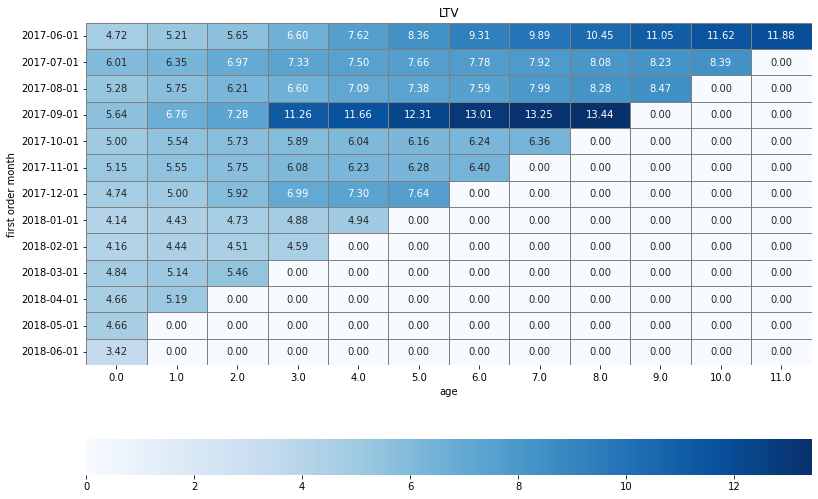

In [168]:
plt.figure(figsize=(13, 9))

Rev_per_user.index=Rev_per_user.index.astype(str)
sns.heatmap(Rev_per_user, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'}, cmap="Blues" 
            ).set(title ='LTV')


plt.show()

In [169]:
cohort_sizes


,n_buyers
first order month,
2017-06-01,2023
2017-07-01,1923
2017-08-01,1370
2017-09-01,2581
2017-10-01,4340
2017-11-01,4081
2017-12-01,4383
2018-01-01,3373
2018-02-01,3651


**Generally, the LTV metric is elevated in cohorts with relatively few users; the ratio is inversely proportional.**

#### Cohort Revenue Visualization ####

In [170]:
orders['Buy Ts'].describe()

count                   50415
unique                  45991
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-06-01 00:02:00
Name: Buy Ts, dtype: object

In [171]:
orders['first order month'].describe()

count                   50415
unique                     13
top       2017-10-01 00:00:00
freq                     6005
first     2017-06-01 00:00:00
last      2018-06-01 00:00:00
Name: first order month, dtype: object

In [172]:
#orders['first purchase month'] = orders['first purchase month'].dt.strftime('%Y-%m') 
cohort_stats = orders.groupby(['session_month'])['Revenue'].sum().reset_index()

cohort_stats

,session_month,Revenue
0,2017-06-01,9557.49
1,2017-07-01,12539.47
2,2017-08-01,8758.78
3,2017-09-01,18345.51
4,2017-10-01,27987.70
5,2017-11-01,27069.93
6,2017-12-01,36388.60
7,2018-01-01,19417.13
8,2018-02-01,25560.54
9,2018-03-01,28834.59


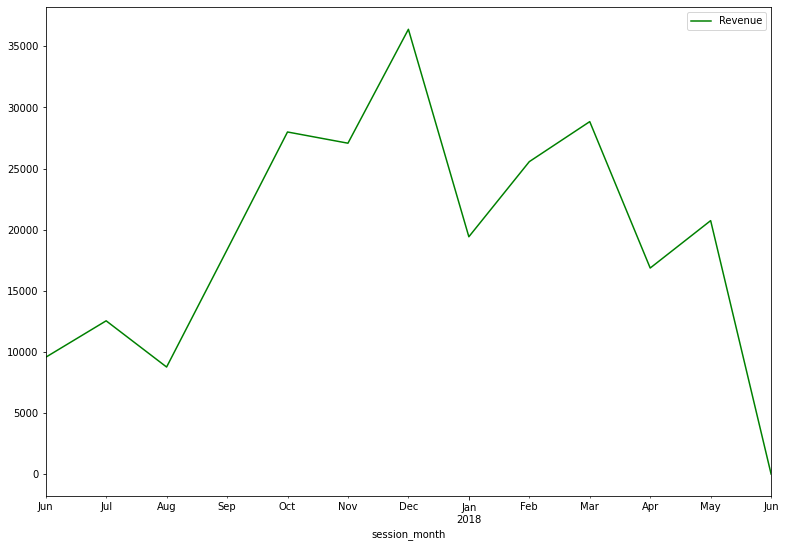

In [173]:
cohort_stats.plot(x='session_month', y='Revenue', color='green', figsize=(13, 9))
plt.show()

**LTV**

In [174]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01,1
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01,1
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01,1
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01,min,2017-10-23 12:32:00,2017-10-01,1


In [175]:
ltv_cohort=orders.groupby(['first order month', 'month'])['Revenue'].sum().reset_index()
ltv_cohort.columns = ['first order month', 'month','revenue']

In [176]:
ltv_cohort

,first order month,month,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58
...,...,...,...
74,2018-03-01,2018-05-01,1114.87
75,2018-04-01,2018-04-01,10600.69
76,2018-04-01,2018-05-01,1209.92
77,2018-05-01,2018-05-01,13925.76


In [177]:
#merge with the cohort size
ltv_cohort=ltv_cohort.merge(cohort_sizes,on=['first order month'])

In [178]:
ltv_cohort['age']=((ltv_cohort['month'] - ltv_cohort['first order month']) / np.timedelta64(1,'M')).round()
ltv_cohort['ltv']=ltv_cohort['revenue']/ltv_cohort['n_buyers']
ltv_cohort = ltv_cohort
ltv_cohort
#.drop(['n_buyers_x, n_buyers_y'],axis=1)

,first order month,month,revenue,n_buyers,age,ltv
0,2017-06-01,2017-06-01,9557.49,2023,0.0,4.724414
1,2017-06-01,2017-07-01,981.82,2023,1.0,0.485329
2,2017-06-01,2017-08-01,885.34,2023,2.0,0.437637
3,2017-06-01,2017-09-01,1931.30,2023,3.0,0.954671
4,2017-06-01,2017-10-01,2068.58,2023,4.0,1.022531
...,...,...,...,...,...,...
74,2018-03-01,2018-05-01,1114.87,3533,2.0,0.315559
75,2018-04-01,2018-04-01,10600.69,2276,0.0,4.657597
76,2018-04-01,2018-05-01,1209.92,2276,1.0,0.531599
77,2018-05-01,2018-05-01,13925.76,2988,0.0,4.660562


In [179]:
ltv_cohort_piv=ltv_cohort.pivot_table(
    index='first order month', 
    columns='age', 
    values='revenue', 
    aggfunc='sum'
).cumsum(axis=1)

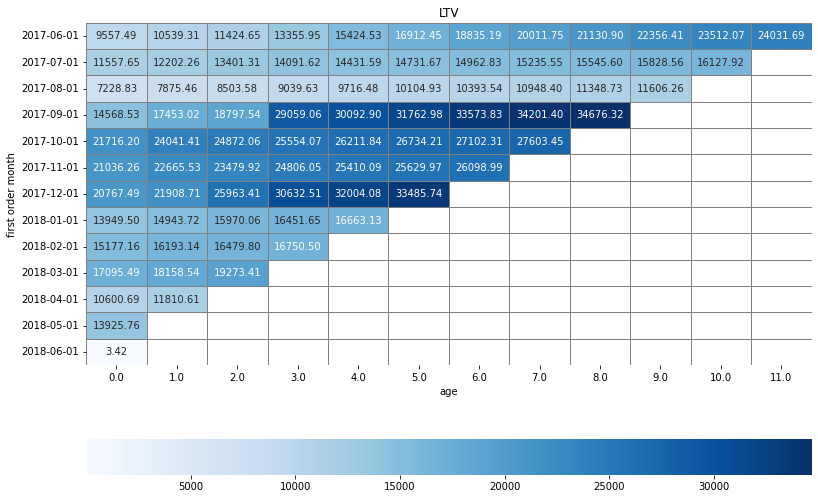

In [180]:
plt.figure(figsize=(13, 9))

ltv_cohort_piv.index=ltv_cohort_piv.index.astype(str)
sns.heatmap(ltv_cohort_piv, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'}, cmap="Blues" 
            ).set(title ='LTV')


plt.show()

**The end of Q3 - Q4 are the most profitable cohorts, which is likely due to holiday spending.**

In [181]:
#Below, please double click on teh seaborn chart.

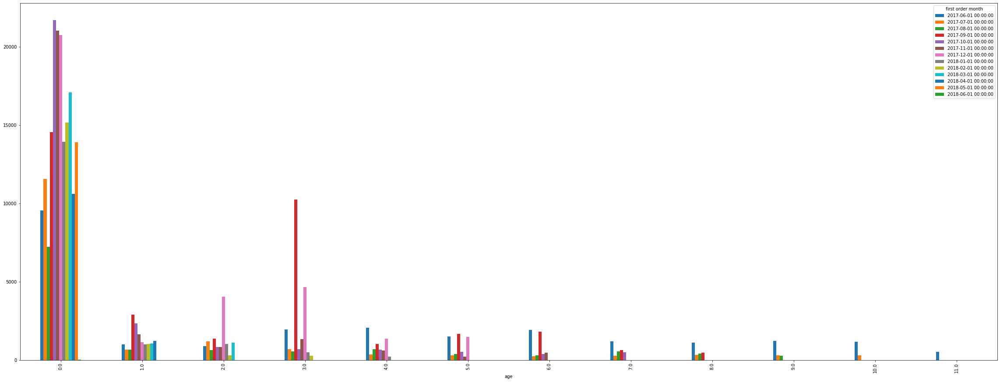

In [182]:

ltv_cohort_chart =ltv_cohort.pivot_table(
    index='age', 
    columns='first order month', 
    values='revenue', 
    aggfunc='sum'#
).plot(kind='bar',figsize=(40,15))


**On a "per-user" basis, the cohorts of  8-2017, 9-2017, and 12-2017 have the highest revenue because of anomolous transaction activity during certain days.**

### Marketing ###

***The costs incurred totals 329131.62. The median/mean daily costs equal to 77.30 / 129.50. The  median / mean monthly costs equal 2837.55 / 3918. Source "3" consistently comprised the majority of the marketing budget. Sources 1 and 2 comprised the highest return from capital invested in marketing. The Q4 2017 - Q1 2017 have the highest marketing costs, which is likely attributable to increased demand during the holiday season, and requires increased frequency of ads.***

In [183]:
costs['session_year'] = costs['dt'].astype('datetime64[Y]')

costs['session_month'] = costs['dt'].astype('datetime64[M]')

costs['session_week'] = costs['dt'].astype('datetime64[W]')

costs['session_date'] = costs['dt'].astype('datetime64[D]')

In [184]:
marketing_by_month=costs.groupby(['session_month'])['costs'].sum().reset_index()
marketing_by_month.head()

,session_month,costs
0,2017-06-01,18015.00
1,2017-07-01,18240.59
2,2017-08-01,14790.54
3,2017-09-01,24368.91
4,2017-10-01,36322.88


In [185]:
fig = px.bar(marketing_by_month, x='session_month', y='costs', title='Total Costs per Month')
fig.show()



In [186]:
orders.head()


,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0


In [187]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session,month,age
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,2017-12-20 17:20:00,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,2018-02-19 16:53:00,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,2018-03-09 20:05:00,2018-03-01,2
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,2018-03-09 20:05:00,2018-03-01,0


In [188]:
costs

,source_id,dt,costs,session_year,session_month,session_week,session_date
0,1,2017-06-01,75.20,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,1,2017-06-02,62.25,2017-01-01,2017-06-01,2017-06-01,2017-06-02
2,1,2017-06-03,36.53,2017-01-01,2017-06-01,2017-06-01,2017-06-03
3,1,2017-06-04,55.00,2017-01-01,2017-06-01,2017-06-01,2017-06-04
4,1,2017-06-05,57.08,2017-01-01,2017-06-01,2017-06-01,2017-06-05
...,...,...,...,...,...,...,...
2537,10,2018-05-27,9.92,2018-01-01,2018-05-01,2018-05-24,2018-05-27
2538,10,2018-05-28,21.26,2018-01-01,2018-05-01,2018-05-24,2018-05-28
2539,10,2018-05-29,11.32,2018-01-01,2018-05-01,2018-05-24,2018-05-29
2540,10,2018-05-30,33.15,2018-01-01,2018-05-01,2018-05-24,2018-05-30


#### Daily Costs by Source ####

In [189]:
costs.costs.sum()

329131.62

In [190]:
Source_Costs_d = (
    costs.groupby(['session_date', 'source_id'])
    .agg({'costs': 'sum'})
    ).reset_index()
Source_Costs_d.columns = ['dt','source_id', 'costs']




fig = px.line(Source_Costs_d, x='dt', y='costs', color='source_id', title=' Daily Costs by Month')
fig.show()


In [191]:
Source_Costs_d.mean()

source_id      4.857199
costs        129.477427
dtype: float64

In [192]:
Source_Costs_d.median()

source_id     4.000
costs        77.295
dtype: float64

In [193]:
Source_Costs_d.mode()

,dt,source_id,costs
0,2017-06-01,5.0,6.35
1,2017-06-02,NaN,10.32
2,2017-06-03,NaN,12.87
3,2017-06-04,NaN,16.25
4,2017-06-05,NaN,16.81
...,...,...,...
358,2018-05-27,NaN,NaN
359,2018-05-28,NaN,NaN
360,2018-05-29,NaN,NaN
361,2018-05-30,NaN,NaN


In [194]:
Source_Costs_m = (
    costs.groupby(['session_month', 'source_id'])
    .agg({'costs': 'sum'})
    ).reset_index()
Source_Costs_m.columns = ['session_month','source_id', 'costs']

Source_Costs_m.median()

source_id       4.00
costs        2837.55
dtype: float64

In [195]:
Source_Costs_m.mean()

source_id       4.857143
costs        3918.233571
dtype: float64

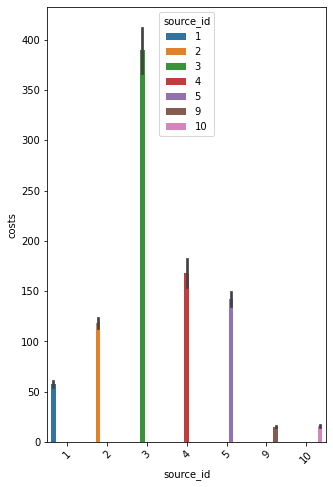

In [196]:
plt.figure(figsize=(5,8))
ax = sns.barplot(x="source_id", y="costs", data=Source_Costs_d, hue='source_id')

plt.xticks(rotation=45)
plt.show()

#### Weekly Costs by Source ####

In [197]:
Source_Costs_w = (
    costs.groupby(['session_week', 'source_id'])
    .agg({'costs': 'sum'})
    ).reset_index()
Source_Costs_w.columns = ['session_week','source_id', 'costs']



fig = px.line(Source_Costs_w, x='session_week', y='costs', color='source_id', title=' Weekly Costs by Month')
fig.show()

In [198]:
Source_Costs_w.describe()

,source_id,costs
count,371.000000,371.000000
mean,4.857143,887.147224
std,3.185876,946.444390
min,1.000000,17.600000
25%,2.000000,157.955000
50%,4.000000,575.830000
75%,9.000000,1234.490000
max,10.000000,6072.040000


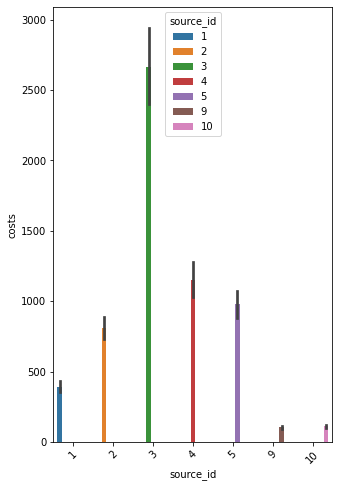

In [199]:
plt.figure(figsize=(5,8))
ax = sns.barplot(x="source_id", y="costs", data=Source_Costs_w, hue='source_id')

plt.xticks(rotation=45)
plt.show()

#### Monthly Costs by Source ####

In [200]:
Source_Costs_m = (
    costs.groupby(['session_month', 'source_id'])
    .agg({'costs': 'sum'})
    ).reset_index()
Source_Costs_m.columns = ['session_month','source_id', 'costs']


fig = px.line(Source_Costs_m, x='session_month', y='costs', color='source_id', title=' Monthly Costs by Month')
fig.show()


Source_Costs_m.describe()

,source_id,costs
count,84.000000,84.000000
mean,4.857143,3918.233571
std,3.200688,3991.439304
min,1.000000,232.570000
25%,2.000000,654.950000
50%,4.000000,2837.550000
75%,9.000000,5375.845000
max,10.000000,17025.340000


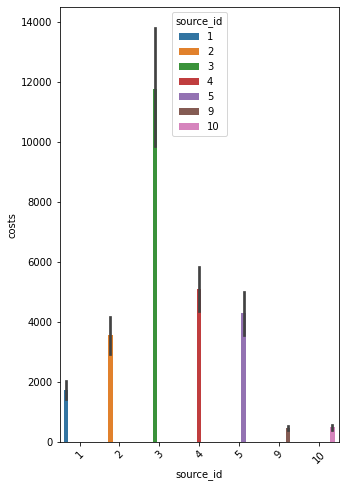

In [201]:
plt.figure(figsize=(5,8))
ax = sns.barplot(x="source_id", y="costs", data=Source_Costs_m, hue='source_id')

plt.xticks(rotation=45)
plt.show()


**Daily Costs Pivot**

In [202]:
dCAC_total = (
    costs.groupby(['dt'])
    .agg({'costs': 'sum'})
    ).reset_index()
dCAC_total.columns = ['dt', 'costs']

dCAC_total.head()

,dt,costs
0,2017-06-01,735.26
1,2017-06-02,721.19
2,2017-06-03,450.85
3,2017-06-04,761.16
4,2017-06-05,821.44


In [203]:
dCAC_total.describe()

,costs
count,364.000000
mean,904.207747
std,396.956825
min,0.700000
25%,595.682500
50%,873.655000
75%,1155.605000
max,3458.860000


In [204]:
dCAC_total.describe()

,costs
count,364.000000
mean,904.207747
std,396.956825
min,0.700000
25%,595.682500
50%,873.655000
75%,1155.605000
max,3458.860000


**Weekly Costs Pivot**

In [205]:
wCAC_total = costs.groupby(['session_year', 'session_week']).agg({'costs': 'sum'}).reset_index()
wCAC_total.columns = ['session_year','session_week', 'costs']

wCAC_total.head()

,session_year,session_week,costs
0,2017-01-01,2017-06-01,4750.61
1,2017-01-01,2017-06-08,4427.52
2,2017-01-01,2017-06-15,3933.09
3,2017-01-01,2017-06-22,3753.14
4,2017-01-01,2017-06-29,3743.03


In [206]:
wCAC_total.describe()

,costs
count,54.000000
mean,6095.030000
std,2184.178196
min,2153.700000
25%,4297.425000
50%,5809.720000
75%,7788.412500
max,11590.380000


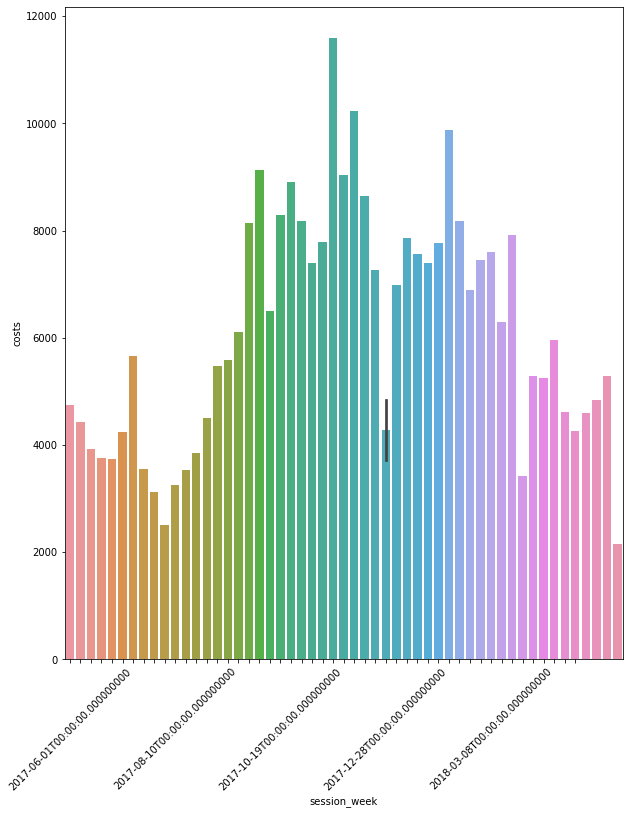

In [207]:
plt.figure(figsize=(10,12))
ax = sns.barplot(x="session_week", y="costs", data=wCAC_total)
ax.set_xticks(range(len(wCAC_total)-5))
plt.xticks(rotation=45)
for ind, label in enumerate(ax.get_xticklabels()):
    if ind % 10 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)
plt.show()

**Monthly Costs Pivot**

In [208]:
mCAC_total = costs.groupby(['session_year', 'session_month']).agg({'costs': 'sum'}).reset_index()
mCAC_total.columns = ['session_year','session_month', 'costs']

mCAC_total

,session_year,session_month,costs
0,2017-01-01,2017-06-01,18015.00
1,2017-01-01,2017-07-01,18240.59
2,2017-01-01,2017-08-01,14790.54
3,2017-01-01,2017-09-01,24368.91
4,2017-01-01,2017-10-01,36322.88
5,2017-01-01,2017-11-01,37907.88
6,2017-01-01,2017-12-01,38315.35
7,2018-01-01,2018-01-01,33518.52
8,2018-01-01,2018-02-01,32723.03
9,2018-01-01,2018-03-01,30415.27


In [209]:
mCAC_total.describe()

,costs
count,12.000000
mean,27427.635000
std,8405.071207
min,14790.540000
25%,21228.350000
50%,27392.090000
75%,34219.610000
max,38315.350000


In [210]:
mCAC_total.costs.sum()

329131.61999999994

**First Source per Buyer**

In [212]:
costs.head()

,source_id,dt,costs,session_year,session_month,session_week,session_date
0,1,2017-06-01,75.20,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,1,2017-06-02,62.25,2017-01-01,2017-06-01,2017-06-01,2017-06-02
2,1,2017-06-03,36.53,2017-01-01,2017-06-01,2017-06-01,2017-06-03
3,1,2017-06-04,55.00,2017-01-01,2017-06-01,2017-06-01,2017-06-04
4,1,2017-06-05,57.08,2017-01-01,2017-06-01,2017-06-01,2017-06-05


In [213]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session,month,age
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,2017-12-20 17:20:00,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,2018-02-19 16:53:00,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,2018-03-09 20:05:00,2018-03-01,2
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,2018-03-09 20:05:00,2018-03-01,0


In [214]:
first_source=visits.sort_values('session_month').groupby('Uid').first()['Source Id'].reset_index()
first_source.columns=['Uid','first_source']
first_source.head()

,Uid,first_source
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
3,313578113262317,2
4,325320750514679,5


In [215]:
orders = orders.merge(first_source,on=['Uid'],how='left')
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3


***Number of new Users each Month***

In [216]:
cohort_sizes


,n_buyers
first order month,
2017-06-01,2023
2017-07-01,1923
2017-08-01,1370
2017-09-01,2581
2017-10-01,4340
2017-11-01,4081
2017-12-01,4383
2018-01-01,3373
2018-02-01,3651


 # How much money was spent? Overall/per source/over time

In [217]:
cohorts.head()

age,0,1,2,3,4,5,6,7,8,9,10,11,12
month,,,,,,,,,,,,,
2017-06-01,13259.0,986.0,710.0,813.0,921.0,880.0,847.0,740.0,743.0,661.0,550.0,526.0,176.0
2017-07-01,13140.0,747.0,680.0,705.0,743.0,640.0,591.0,645.0,489.0,383.0,321.0,71.0,0.0
2017-08-01,10181.0,705.0,629.0,602.0,522.0,426.0,423.0,345.0,297.0,234.0,33.0,0.0,0.0
2017-09-01,16704.0,1278.0,1110.0,826.0,669.0,663.0,554.0,429.0,334.0,43.0,0.0,0.0,0.0
2017-10-01,25977.0,1911.0,1367.0,996.0,949.0,808.0,549.0,464.0,85.0,0.0,0.0,0.0,0.0


In [218]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3


In [219]:
cohort_sizes

,n_buyers
first order month,
2017-06-01,2023
2017-07-01,1923
2017-08-01,1370
2017-09-01,2581
2017-10-01,4340
2017-11-01,4081
2017-12-01,4383
2018-01-01,3373
2018-02-01,3651


In [220]:
dCAC_total = (
    costs.groupby(['dt'])
    .agg({'costs': 'sum'})
    ).reset_index()
dCAC_total.columns = ['dt', 'costs']

dCAC_total

,dt,costs
0,2017-06-01,735.26
1,2017-06-02,721.19
2,2017-06-03,450.85
3,2017-06-04,761.16
4,2017-06-05,821.44
...,...,...
359,2018-05-27,532.87
360,2018-05-28,619.44
361,2018-05-29,784.79
362,2018-05-30,1183.00


# CAC / ROMI  Calculations #

In [221]:
orders

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 09:11:00,2018-05-01,1,4
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:50:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:05:00,2018-05-01,1,10
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:54:00,2018-05-01,2018-05-01,2018-05-01,min,2018-05-31 23:52:00,2018-05-01,1,3
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-01-01,2018-05-01,2018-05-31,2018-05-31,2018-05-31 23:56:00,2018-05-01,2018-05-01,2018-05-01,min,2017-10-23 12:32:00,2017-10-01,1,3


#### CAC per Month ####

In [222]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session,month,age
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,2017-12-20 17:20:00,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,2018-02-19 16:53:00,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,2018-03-09 20:05:00,2018-03-01,2
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,2018-03-09 20:05:00,2018-03-01,0


***Extracting first source from "visits" table.***

In [223]:
first_source=visits.sort_values('session_month').groupby('Uid').first()['Source Id'].reset_index()
first_source.columns=['Uid','first_source']
first_source.head()

,Uid,first_source
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
3,313578113262317,2
4,325320750514679,5


In [224]:
first_order_date = orders.sort_values(['session_month']).groupby(['Uid', 'session_month']).first()['session_date'].reset_index()

In [225]:
first_order_date.head()

,Uid,session_month,session_date
0,313578113262317,2018-01-01,2018-01-03
1,1575281904278712,2017-06-01,2017-06-03
2,2429014661409475,2017-10-01,2017-10-11
3,2464366381792757,2018-01-01,2018-01-28
4,2551852515556206,2017-11-01,2017-11-24


In [226]:
first_data = first_order_date.merge(first_source,how='left',on=['Uid'])

In [227]:
first_data.head()

,Uid,session_month,session_date,first_source
0,313578113262317,2018-01-01,2018-01-03,2
1,1575281904278712,2017-06-01,2017-06-03,10
2,2429014661409475,2017-10-01,2017-10-11,3
3,2464366381792757,2018-01-01,2018-01-28,5
4,2551852515556206,2017-11-01,2017-11-24,5


In [228]:
orders.head()


,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3


In [229]:
buyers_per_month=orders.groupby(['first order month', 'first_source'])['Uid'].nunique().reset_index()

***Renaming "first_source" as "source."***

In [230]:
buyers_per_month.columns=['session_month','source','buyers']
buyers_per_month.head()

,session_month,source,buyers
0,2017-06-01,1,220
1,2017-06-01,2,266
2,2017-06-01,3,601
3,2017-06-01,4,398
4,2017-06-01,5,377


***Grouping new table by source id and first order day and counting uid.***

In [231]:
source_visit_count = first_data.groupby(['session_date', 'first_source'])['Uid'].nunique().reset_index()

In [232]:
source_visit_count = source_visit_count.rename(columns={"first_source":"first_source", 'session_date':'session_date'})

In [233]:
source_visit_count.head()

,session_date,first_source,Uid
0,2017-06-01,1,12
1,2017-06-01,2,14
2,2017-06-01,3,24
3,2017-06-01,4,10
4,2017-06-01,5,11


***Merging source_visit_count with the "Costs" table.***

In [234]:
costs.head()

,source_id,dt,costs,session_year,session_month,session_week,session_date
0,1,2017-06-01,75.20,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,1,2017-06-02,62.25,2017-01-01,2017-06-01,2017-06-01,2017-06-02
2,1,2017-06-03,36.53,2017-01-01,2017-06-01,2017-06-01,2017-06-03
3,1,2017-06-04,55.00,2017-01-01,2017-06-01,2017-06-01,2017-06-04
4,1,2017-06-05,57.08,2017-01-01,2017-06-01,2017-06-01,2017-06-05


In [235]:
Costs_source_visit_count = source_visit_count.merge(costs,left_on=['first_source', 'session_date'], right_on=['source_id', 'dt'])
#.drop('level_2',axis=1)

In [236]:
Costs_source_visit_count.head()

,session_date_x,first_source,Uid,source_id,dt,costs,session_year,session_month,session_week,session_date_y
0,2017-06-01,1,12,1,2017-06-01,75.20,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01,2,14,2,2017-06-01,132.56,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01,3,24,3,2017-06-01,349.38,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01,4,10,4,2017-06-01,76.74,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01,5,11,5,2017-06-01,73.24,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [237]:
marketing_by_month=costs.groupby(['session_month'])['costs'].sum().reset_index()
marketing_by_month.columns=['session_month', 'costs']
marketing_by_month.head()

,session_month,costs
0,2017-06-01,18015.00
1,2017-07-01,18240.59
2,2017-08-01,14790.54
3,2017-09-01,24368.91
4,2017-10-01,36322.88


***Applying mean function to CAC*** 

In [238]:
CAC_per_month=marketing_by_month.merge(buyers_per_month,how='left',on=['session_month'])
CAC_per_month['CAC']= CAC_per_month['costs'].mean()/CAC_per_month['buyers']
CAC_per_month.head()

,session_month,costs,source,buyers,CAC
0,2017-06-01,18015.0,1,220,123.995288
1,2017-06-01,18015.0,2,266,102.552494
2,2017-06-01,18015.0,3,601,45.389290
3,2017-06-01,18015.0,4,398,68.540109
4,2017-06-01,18015.0,5,377,72.357993


In [239]:
fig = px.bar(CAC_per_month, x='session_month', y='CAC', title='CAC per Month')
fig.show()



***Filtering out Outliers in August 2017 to simplify visualization.***

In [240]:
x = CAC_per_month.query('CAC < 2000')
fig = px.bar(x, x='session_month', y='CAC', title='CAC per Month')
fig.show()


***It's noteworthy that the holiday season is typified by low CAC.***

#### CAC per Source ####

In [242]:
Costs_source_visit_count.head()

,session_date_x,first_source,Uid,source_id,dt,costs,session_year,session_month,session_week,session_date_y
0,2017-06-01,1,12,1,2017-06-01,75.20,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01,2,14,2,2017-06-01,132.56,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01,3,24,3,2017-06-01,349.38,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01,4,10,4,2017-06-01,76.74,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01,5,11,5,2017-06-01,73.24,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [243]:
costs.head()

,source_id,dt,costs,session_year,session_month,session_week,session_date
0,1,2017-06-01,75.20,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,1,2017-06-02,62.25,2017-01-01,2017-06-01,2017-06-01,2017-06-02
2,1,2017-06-03,36.53,2017-01-01,2017-06-01,2017-06-01,2017-06-03
3,1,2017-06-04,55.00,2017-01-01,2017-06-01,2017-06-01,2017-06-04
4,1,2017-06-05,57.08,2017-01-01,2017-06-01,2017-06-01,2017-06-05


In [244]:

source_cost_day= costs.groupby(['source_id',  'session_date' ]).agg({"costs":["sum"]}).stack().reset_index().drop('level_2',axis=1)

source_cost_day.head()

,source_id,session_date,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [245]:
source_cost_month = costs.groupby(['source_id', 'session_month']).agg({"costs":["sum"]}).stack().reset_index().drop('level_2',axis=1)

source_cost_month.head()

,source_id,session_month,costs
0,1,2017-06-01,1125.61
1,1,2017-07-01,1072.88
2,1,2017-08-01,951.81
3,1,2017-09-01,1502.01
4,1,2017-10-01,2315.75


In [246]:
orders['Buyer'] = 'Yes'
customers_df = orders.groupby(['Uid'])['Buyer'].count().reset_index()
customers_df.columns = ['Uid', 'Order Count']
customers_df.head()

,Uid,Order Count
0,313578113262317,1
1,1575281904278712,2
2,2429014661409475,1
3,2464366381792757,1
4,2551852515556206,2


In [247]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session,month,age
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,2017-12-20 17:20:00,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,2018-02-19 16:53:00,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,2018-03-09 20:05:00,2018-03-01,2
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,2018-03-09 20:05:00,2018-03-01,0


***Added session date to "first visit" for use in CAC calculation.***

In [248]:
first_visit_day = visits.sort_values('Start Ts').groupby(['session_date','Uid'])['Source Id'].first().reset_index()
first_visit_day.head()

,session_date,Uid,Source Id
0,2017-06-01,32197920403662046,4
1,2017-06-01,184148767273119549,2
2,2017-06-01,254239507810036143,9
3,2017-06-01,258099436367309303,5
4,2017-06-01,300776506671194537,5


In [249]:
first_visit_month = visits.sort_values('Start Ts').groupby(['session_month','Uid'])['Source Id'].first().reset_index()
first_visit_month.head()

,session_month,Uid,Source Id
0,2017-06-01,297729379853735,3
1,2017-06-01,407573351275847,2
2,2017-06-01,1349311730029478,5
3,2017-06-01,1575281904278712,10
4,2017-06-01,2471247936243530,9


In [250]:
customer_df_day = pd.merge(first_visit_day, customers_df, how='inner', on='Uid').dropna()
customer_df_day.head()

,session_date,Uid,Source Id,Order Count
0,2017-06-01,184148767273119549,2,1
1,2017-06-02,184148767273119549,2,1
2,2017-06-05,184148767273119549,2,1
3,2017-06-06,184148767273119549,2,1
4,2017-06-07,184148767273119549,3,1


In [251]:
customer_df_month = pd.merge(first_visit_month, customers_df, how='outer', on='Uid').dropna()
customer_df_month.head()

,session_month,Uid,Source Id,Order Count
3,2017-06-01,1575281904278712,10,2.0
8,2017-06-01,16233238570251706,3,1.0
10,2017-06-01,28094489227360733,1,5.0
11,2017-07-01,28094489227360733,3,5.0
12,2017-08-01,28094489227360733,3,5.0


In [252]:
customer_df_count_day = customer_df_day.groupby(['session_date','Source Id']).agg({'Uid':['nunique'],
                                                            'Order Count':['sum']}).stack().reset_index()
customer_df_count_day['Order Count'] = customer_df_count_day['Order Count'].shift(-1)
customer_df_count_day = customer_df_count_day.drop('level_2',axis=1).dropna().rename(columns={'Uid':'Unique Buyers'})
customer_df_count_day.head()

,session_date,Source Id,Unique Buyers,Order Count
0,2017-06-01,1,24.0,565.0
2,2017-06-01,2,28.0,288.0
4,2017-06-01,3,46.0,84.0
6,2017-06-01,4,31.0,53.0
8,2017-06-01,5,21.0,52.0


In [253]:
customer_df_count_month = customer_df_month.groupby(['session_month','Source Id']).agg({'Uid':['nunique'],
                                                            'Order Count':['sum']}).stack().reset_index()
customer_df_count_month['Order Count'] = customer_df_count_month['Order Count'].shift(-1)
customer_df_count_month = customer_df_count_month.drop('level_2',axis=1).dropna().rename(columns={'Uid':'Unique Buyers'})
customer_df_count_month.head()
#

,session_month,Source Id,Unique Buyers,Order Count
0,2017-06-01,1,240.0,1453.0
2,2017-06-01,2,374.0,1017.0
4,2017-06-01,3,886.0,1286.0
6,2017-06-01,4,647.0,1129.0
8,2017-06-01,5,509.0,1066.0


In [254]:
customer_df_count_day.head()

,session_date,Source Id,Unique Buyers,Order Count
0,2017-06-01,1,24.0,565.0
2,2017-06-01,2,28.0,288.0
4,2017-06-01,3,46.0,84.0
6,2017-06-01,4,31.0,53.0
8,2017-06-01,5,21.0,52.0


In [255]:
source_cost_day.head()

,source_id,session_date,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [256]:
cac_source_day = pd.merge(customer_df_count_day, source_cost_day, how='right', left_on='Source Id', right_on='source_id').drop('session_date_y',axis=1)
cac_source_day = cac_source_day.rename(columns={'session_date_x':'session_date'})
cac_source_day.head()

,session_date,Source Id,Unique Buyers,Order Count,source_id,costs
0,2017-06-01,1,24.0,565.0,1,75.2
1,2017-06-02,1,21.0,225.0,1,75.2
2,2017-06-03,1,15.0,124.0,1,75.2
3,2017-06-04,1,12.0,186.0,1,75.2
4,2017-06-05,1,35.0,606.0,1,75.2


In [257]:
customer_df_count_month.head()

,session_month,Source Id,Unique Buyers,Order Count
0,2017-06-01,1,240.0,1453.0
2,2017-06-01,2,374.0,1017.0
4,2017-06-01,3,886.0,1286.0
6,2017-06-01,4,647.0,1129.0
8,2017-06-01,5,509.0,1066.0


In [258]:
source_cost_month.head()

,source_id,session_month,costs
0,1,2017-06-01,1125.61
1,1,2017-07-01,1072.88
2,1,2017-08-01,951.81
3,1,2017-09-01,1502.01
4,1,2017-10-01,2315.75


In [259]:
cac_source_month = pd.merge(customer_df_count_month, source_cost_month, how='right', left_on='Source Id', right_on='source_id').drop('session_month_y',axis=1)
cac_source_month = cac_source_month.rename(columns={'session_month_x':'session_month'})
cac_source_month.head()

,session_month,Source Id,Unique Buyers,Order Count,source_id,costs
0,2017-06-01,1,240.0,1453.0,1,1125.61
1,2017-07-01,1,238.0,835.0,1,1125.61
2,2017-08-01,1,188.0,622.0,1,1125.61
3,2017-09-01,1,340.0,1115.0,1,1125.61
4,2017-10-01,1,492.0,1671.0,1,1125.61


In [260]:
cac_source_day['CAC_Unique'] = round((cac_source_day['costs'] / cac_source_day['Unique Buyers']), 2)
cac_source_day['CAC'] = round((cac_source_day['costs'] / cac_source_day['Order Count']), 2)
cac_source_day.head()

,session_date,Source Id,Unique Buyers,Order Count,source_id,costs,CAC_Unique,CAC
0,2017-06-01,1,24.0,565.0,1,75.2,3.13,0.13
1,2017-06-02,1,21.0,225.0,1,75.2,3.58,0.33
2,2017-06-03,1,15.0,124.0,1,75.2,5.01,0.61
3,2017-06-04,1,12.0,186.0,1,75.2,6.27,0.40
4,2017-06-05,1,35.0,606.0,1,75.2,2.15,0.12


In [261]:
CAC_by_Source_day = cac_source_day.groupby(['session_date','Source Id'])['CAC_Unique'].sum().reset_index()


In [262]:
cac_source_month['CAC_Unique'] = round((cac_source_month['costs'] / cac_source_month['Unique Buyers']), 2)
cac_source_month['CAC'] = round((cac_source_month['costs'] / cac_source_month['Order Count']), 2)
cac_source_month.head()

,session_month,Source Id,Unique Buyers,Order Count,source_id,costs,CAC_Unique,CAC
0,2017-06-01,1,240.0,1453.0,1,1125.61,4.69,0.77
1,2017-07-01,1,238.0,835.0,1,1125.61,4.73,1.35
2,2017-08-01,1,188.0,622.0,1,1125.61,5.99,1.81
3,2017-09-01,1,340.0,1115.0,1,1125.61,3.31,1.01
4,2017-10-01,1,492.0,1671.0,1,1125.61,2.29,0.67


In [263]:
CAC_by_Source_month =  cac_source_month.groupby(['session_month','Source Id'])['CAC_Unique'].sum().reset_index()

In [264]:
cac_source_day['CAC_Unique'].describe()

count    912219.000000
mean          5.118492
std           7.767637
min           0.000000
25%           1.560000
50%           3.110000
75%           6.020000
max         894.140000
Name: CAC_Unique, dtype: float64

In [265]:
cac_source_month['CAC_Unique'].describe() 

count    1008.000000
mean        5.642827
std         4.125832
min         0.490000
25%         2.810000
50%         4.575000
75%         7.145000
max        32.180000
Name: CAC_Unique, dtype: float64

In [266]:
fig = px.line(CAC_by_Source_day, x='session_date', y='CAC_Unique', color='Source Id', title=' Daily CAC by Source')
fig.show()

In [267]:
fig = px.line(CAC_by_Source_month, x='session_month', y='CAC_Unique', color='Source Id', title=' Monthly CAC by Source')
fig.show()

***Sources 2, and 3 have the highest CAC, and concomitantly have the highest costs as indicated hereinabove.***

In [268]:
buyers_per_month = buyers_per_month.rename(columns={"source":"source_id"})

In [269]:
buyers_per_month_source=orders.groupby(['first_order_month','first_source'])['Uid'].nunique().reset_index()
buyers_per_month_source.columns=['session_month','source_id','buyers']
buyers_per_month_source.head()

,session_month,source_id,buyers
0,2017-06-01,1,220
1,2017-06-01,2,266
2,2017-06-01,3,601
3,2017-06-01,4,398
4,2017-06-01,5,377


#### ROI ####

***Adding sources column to LTV cohort table.***

In [278]:
# First visit from "visits" table already merged with "orders", above.

In [279]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source,Buyer
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1,Yes
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2,Yes
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3,Yes


In [282]:
ltv_cohort=orders.groupby(['first_order_month', 'month', 'first_source'])['Revenue'].sum().reset_index()
ltv_cohort.columns = ['first order month', 'month', 'source', 'revenue']

In [283]:
ltv_cohort.head()

,first order month,month,source,revenue
0,2017-06-01,2017-06-01,1,1507.98
1,2017-06-01,2017-06-01,2,1312.11
2,2017-06-01,2017-06-01,3,2621.31
3,2017-06-01,2017-06-01,4,1845.13
4,2017-06-01,2017-06-01,5,1830.33


In [284]:
CAC_per_month

,session_month,costs,source,buyers,CAC
0,2017-06-01,18015.00,1,220,123.995288
1,2017-06-01,18015.00,2,266,102.552494
2,2017-06-01,18015.00,3,601,45.389290
3,2017-06-01,18015.00,4,398,68.540109
4,2017-06-01,18015.00,5,377,72.357993
...,...,...,...,...,...
80,2018-05-01,22224.27,3,803,33.971312
81,2018-05-01,22224.27,4,763,35.752245
82,2018-05-01,22224.27,5,521,52.358855
83,2018-05-01,22224.27,9,57,478.578303


In [285]:
cac_source_month.head()

,session_month,Source Id,Unique Buyers,Order Count,source_id,costs,CAC_Unique,CAC
0,2017-06-01,1,240.0,1453.0,1,1125.61,4.69,0.77
1,2017-07-01,1,238.0,835.0,1,1125.61,4.73,1.35
2,2017-08-01,1,188.0,622.0,1,1125.61,5.99,1.81
3,2017-09-01,1,340.0,1115.0,1,1125.61,3.31,1.01
4,2017-10-01,1,492.0,1671.0,1,1125.61,2.29,0.67


In [286]:
CAC_per_month_ROI=cac_source_month[['session_month','CAC_Unique']]

In [287]:
CAC_per_month_ROI

,session_month,CAC_Unique
0,2017-06-01,4.69
1,2017-07-01,4.73
2,2017-08-01,5.99
3,2017-09-01,3.31
4,2017-10-01,2.29
...,...,...
1003,2018-01-01,2.95
1004,2018-02-01,2.55
1005,2018-03-01,1.79
1006,2018-04-01,2.71


In [288]:
CAC_per_month_ROI = CAC_per_month_ROI.groupby(['session_month'])['CAC_Unique'].sum().reset_index()


In [289]:
CAC_per_month_ROI.columns=['first order month','CAC']
ROI=ltv_cohort.merge(CAC_per_month_ROI,on=['first order month'],how='left')
ROI.tail()

,first order month,month,source,revenue,CAC
515,2018-05-01,2018-05-01,4,3613.77,445.21
516,2018-05-01,2018-05-01,5,2116.90,445.21
517,2018-05-01,2018-05-01,9,201.21,445.21
518,2018-05-01,2018-05-01,10,451.84,445.21
519,2018-06-01,2018-06-01,4,3.42,NaN


In [290]:
ROI['ROI']=ROI['revenue']/ROI['CAC']
ROI['age']=((ROI['month'] - ROI['first order month']) / np.timedelta64(1,'M')).round()
roi_piv = ROI.pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

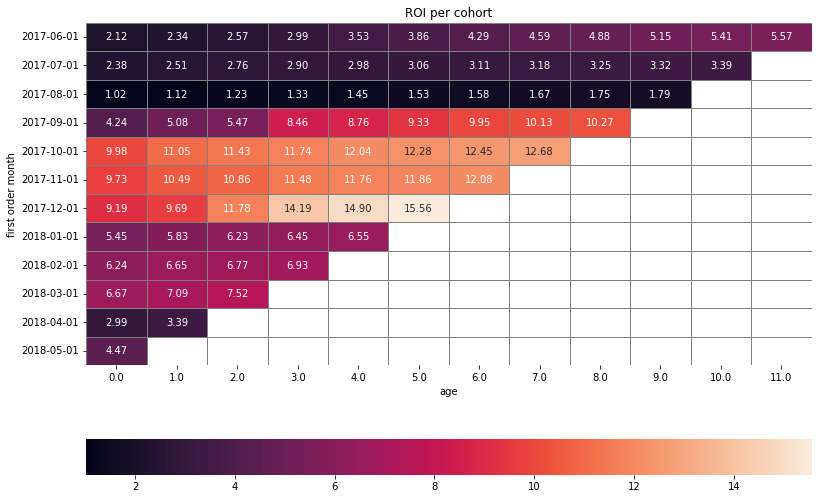

In [291]:
plt.figure(figsize=(13, 9))# Set the figure size
roi_piv.index=roi_piv.index.astype(str)
sns.heatmap(roi_piv, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            ).set(title ='ROI per cohort')
plt.show()

In [292]:
ROI

,first order month,month,source,revenue,CAC,ROI,age
0,2017-06-01,2017-06-01,1,1507.98,644.21,2.340821,0.0
1,2017-06-01,2017-06-01,2,1312.11,644.21,2.036774,0.0
2,2017-06-01,2017-06-01,3,2621.31,644.21,4.069030,0.0
3,2017-06-01,2017-06-01,4,1845.13,644.21,2.864175,0.0
4,2017-06-01,2017-06-01,5,1830.33,644.21,2.841201,0.0
...,...,...,...,...,...,...,...
515,2018-05-01,2018-05-01,4,3613.77,445.21,8.117001,0.0
516,2018-05-01,2018-05-01,5,2116.90,445.21,4.754835,0.0
517,2018-05-01,2018-05-01,9,201.21,445.21,0.451944,0.0
518,2018-05-01,2018-05-01,10,451.84,445.21,1.014892,0.0


**According to the heatmap, the cohorts with the highest ROI are the Q4 2017 cohorts.**

#### LTV by Source ####

In [294]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source,Buyer
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1,Yes
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2,Yes
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3,Yes


In [295]:
ltv_cohort=orders.groupby(['first order month', 'month', 'first_source'])['Revenue'].sum().reset_index()
ltv_cohort.columns = ['first order month', 'month', 'source', 'revenue']

In [296]:
ltv_cohort

,first order month,month,source,revenue
0,2017-06-01,2017-06-01,1,1507.98
1,2017-06-01,2017-06-01,2,1312.11
2,2017-06-01,2017-06-01,3,2621.31
3,2017-06-01,2017-06-01,4,1845.13
4,2017-06-01,2017-06-01,5,1830.33
...,...,...,...,...
515,2018-05-01,2018-05-01,4,3613.77
516,2018-05-01,2018-05-01,5,2116.90
517,2018-05-01,2018-05-01,9,201.21
518,2018-05-01,2018-05-01,10,451.84


In [297]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source,Buyer
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1,Yes
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2,Yes
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3,Yes


In [298]:
ltv_per_source=orders.groupby(['first_source'])['Uid','Revenue'].agg({'Uid':'nunique','Revenue':'sum'}).reset_index()
ltv_per_source.columns=['source_id','buyers','Revenue']
ltv_per_source['ltv']=ltv_per_source['Revenue']/ltv_per_source['buyers']
ltv_per_source

,source_id,buyers,Revenue,ltv
0,1,3668,39813.95,10.854403
1,2,3929,50107.14,12.753153
2,3,9620,48031.81,4.992912
3,4,9864,52374.58,5.309670
4,5,7019,51420.72,7.325932
5,7,1,1.22,1.220000
6,9,1151,5927.39,5.149774
7,10,1271,4380.39,3.446412


In [299]:
fig = px.bar(ltv_per_source, x='source_id', y='ltv',  title='Mean LTV per Source')
fig.update_xaxes(type='category')
fig.show()

In [300]:
ltv_per_source = ltv_per_source.rename(columns={"source_id":"source"})
ltv_per_source

,source,buyers,Revenue,ltv
0,1,3668,39813.95,10.854403
1,2,3929,50107.14,12.753153
2,3,9620,48031.81,4.992912
3,4,9864,52374.58,5.309670
4,5,7019,51420.72,7.325932
5,7,1,1.22,1.220000
6,9,1151,5927.39,5.149774
7,10,1271,4380.39,3.446412


In [301]:
ltv_cohort.head()

,first order month,month,source,revenue
0,2017-06-01,2017-06-01,1,1507.98
1,2017-06-01,2017-06-01,2,1312.11
2,2017-06-01,2017-06-01,3,2621.31
3,2017-06-01,2017-06-01,4,1845.13
4,2017-06-01,2017-06-01,5,1830.33


In [302]:
ltv_cohort['age']=((ltv_cohort['month'] - ltv_cohort['first order month']) / np.timedelta64(1,'M')).round()
ltv_cohort

,first order month,month,source,revenue,age
0,2017-06-01,2017-06-01,1,1507.98,0.0
1,2017-06-01,2017-06-01,2,1312.11,0.0
2,2017-06-01,2017-06-01,3,2621.31,0.0
3,2017-06-01,2017-06-01,4,1845.13,0.0
4,2017-06-01,2017-06-01,5,1830.33,0.0
...,...,...,...,...,...
515,2018-05-01,2018-05-01,4,3613.77,0.0
516,2018-05-01,2018-05-01,5,2116.90,0.0
517,2018-05-01,2018-05-01,9,201.21,0.0
518,2018-05-01,2018-05-01,10,451.84,0.0


In [303]:
per_sorce_ltv = ltv_per_source.merge(ltv_cohort,on=['source'], how='right')
per_sorce_ltv

,source,buyers,Revenue,ltv,first order month,month,revenue,age
0,1,3668,39813.95,10.854403,2017-06-01,2017-06-01,1507.98,0.0
1,2,3929,50107.14,12.753153,2017-06-01,2017-06-01,1312.11,0.0
2,3,9620,48031.81,4.992912,2017-06-01,2017-06-01,2621.31,0.0
3,4,9864,52374.58,5.309670,2017-06-01,2017-06-01,1845.13,0.0
4,5,7019,51420.72,7.325932,2017-06-01,2017-06-01,1830.33,0.0
...,...,...,...,...,...,...,...,...
515,4,9864,52374.58,5.309670,2018-05-01,2018-05-01,3613.77,0.0
516,5,7019,51420.72,7.325932,2018-05-01,2018-05-01,2116.90,0.0
517,9,1151,5927.39,5.149774,2018-05-01,2018-05-01,201.21,0.0
518,10,1271,4380.39,3.446412,2018-05-01,2018-05-01,451.84,0.0


In [304]:
ltv_pivot = per_sorce_ltv.pivot_table(
    index='first order month', columns='age', values='ltv', aggfunc='mean'
).cumsum(axis=1).round(2) 

#### ROI by Source ####

In [305]:
orders.head()

,Buy Ts,Revenue,Uid,session_year,session_month,session_week,session_date,first_order_date,first_order_month,first order month,month,level_1,first_visit,first_visit_month,conversion,first_source,Buyer
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:09:00,2017-06-01,0,1,Yes
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:25:00,2017-06-01,0,2,Yes
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 00:14:00,2017-06-01,0,2,Yes
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,min,2017-06-01 07:31:00,2017-06-01,0,3,Yes


In [306]:
marketing_per_source=costs.groupby(['source_id'])['costs'].sum().reset_index()
marketing_per_source.head()

,source_id,costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10


In [307]:
ltv_per_source = ltv_per_source.rename(columns={'source':'source_id'})

In [308]:
roi_per_source=marketing_per_source.merge(ltv_per_source,on=['source_id'])
roi_per_source['cac']=roi_per_source['costs']/roi_per_source['buyers']
roi_per_source['romi']=roi_per_source['ltv']/roi_per_source['cac']
roi_per_source

,source_id,costs,buyers,Revenue,ltv,cac,romi
0,1,20833.27,3668,39813.95,10.854403,5.679736,1.911075
1,2,42806.04,3929,50107.14,12.753153,10.894894,1.170562
2,3,141321.63,9620,48031.81,4.992912,14.690398,0.339876
3,4,61073.60,9864,52374.58,5.309670,6.191565,0.857565
4,5,51757.10,7019,51420.72,7.325932,7.373857,0.993501
5,9,5517.49,1151,5927.39,5.149774,4.793649,1.074291
6,10,5822.49,1271,4380.39,3.446412,4.581031,0.752322


In [309]:
fig = px.bar(roi_per_source, x='source_id', y='romi',  title='ROI per Source')
fig.update_xaxes(type='category')
fig.show()

In [310]:
ROI.head()

,first order month,month,source,revenue,CAC,ROI,age
0,2017-06-01,2017-06-01,1,1507.98,644.21,2.340821,0.0
1,2017-06-01,2017-06-01,2,1312.11,644.21,2.036774,0.0
2,2017-06-01,2017-06-01,3,2621.31,644.21,4.069030,0.0
3,2017-06-01,2017-06-01,4,1845.13,644.21,2.864175,0.0
4,2017-06-01,2017-06-01,5,1830.33,644.21,2.841201,0.0


In [311]:
s1 = ROI.query('source == 1').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [312]:
s2 = ROI.query('source == 2').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [313]:
s3 = ROI.query('source == 3').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [314]:
s4 = ROI.query('source == 4').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [315]:
s5 = ROI.query('source == 5').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [316]:
s6 = ROI.query('source == 6').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [317]:
s7 = ROI.query('source == 7').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [318]:
s8 = ROI.query('source == 8').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [319]:
s9 = ROI.query('source == 9').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

In [320]:
s10 = ROI.query('source == 10').pivot_table(
    index='first order month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 

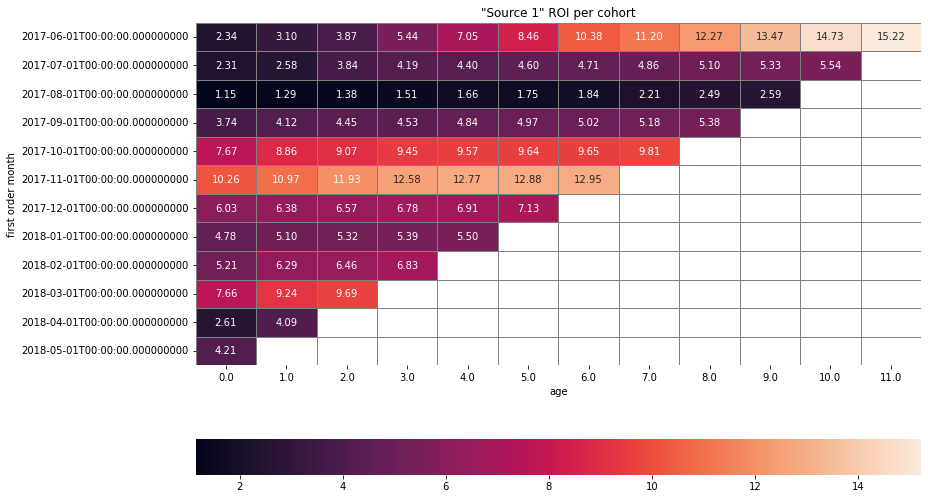

In [321]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s1, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            ).set(title ='"Source 1" ROI per cohort')
plt.show()

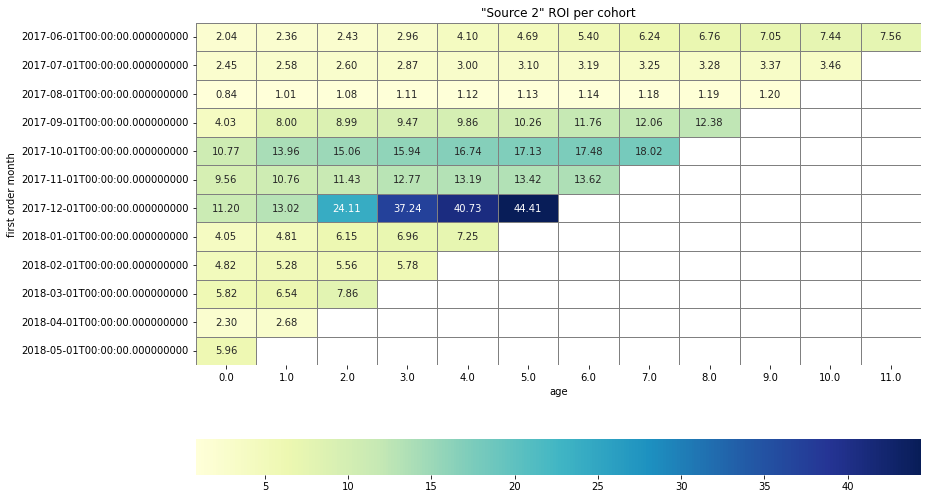

In [322]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s2, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'},cmap="YlGnBu" 
            ).set(title ='"Source 2" ROI per cohort')
plt.show()

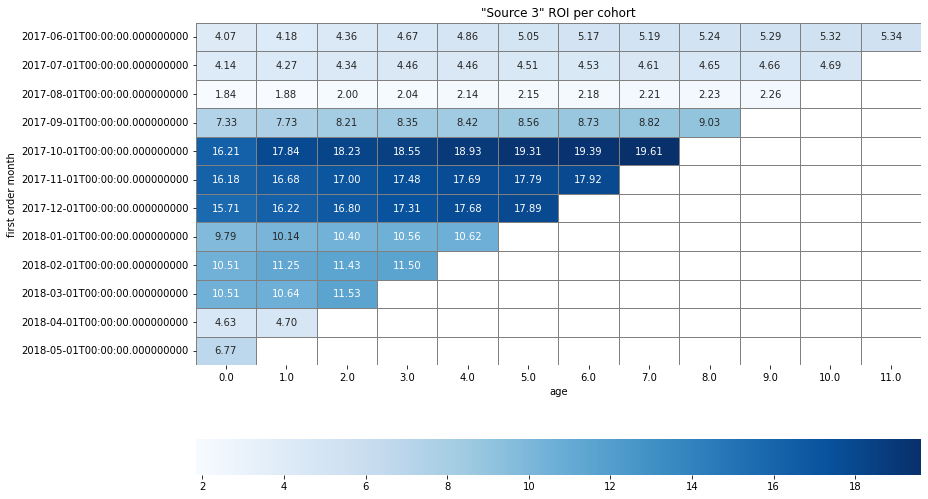

In [323]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s3, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'},cmap="Blues" 
            ).set(title ='"Source 3" ROI per cohort')
plt.show()

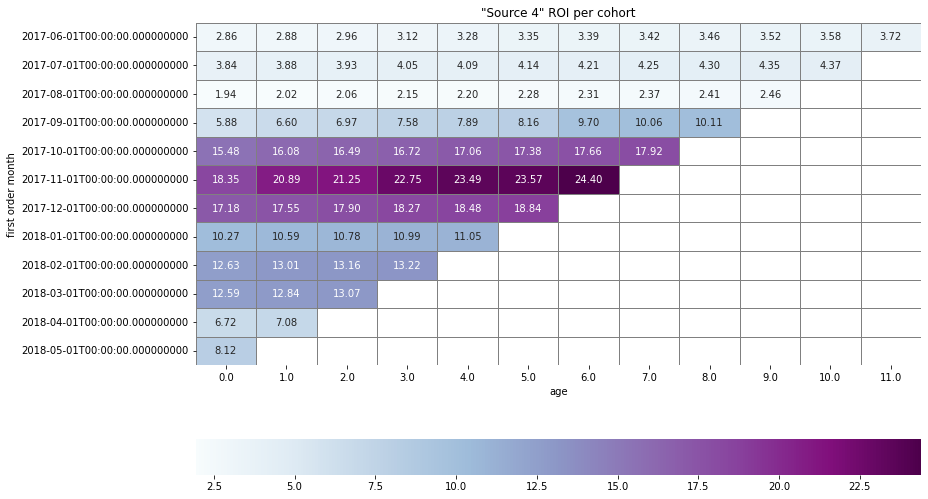

In [324]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s4, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'},cmap="BuPu" 
            ).set(title ='"Source 4" ROI per cohort')
plt.show()

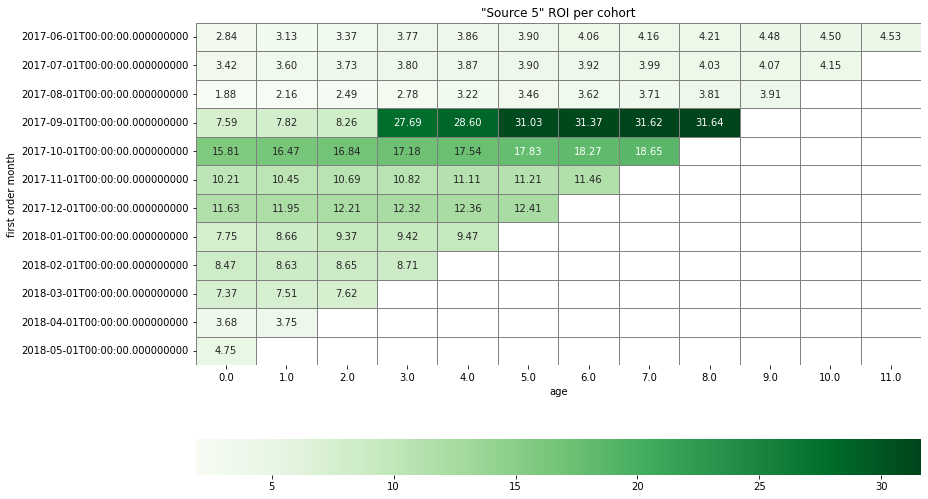

In [325]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s5, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'},cmap="Greens" 
            ).set(title ='"Source 5" ROI per cohort')
plt.show()

***The ROI derived from Source was exceptionally remunerative for the cohorts from September 2017 - February 2018.***

# Sources 6 - 8 are nil. #

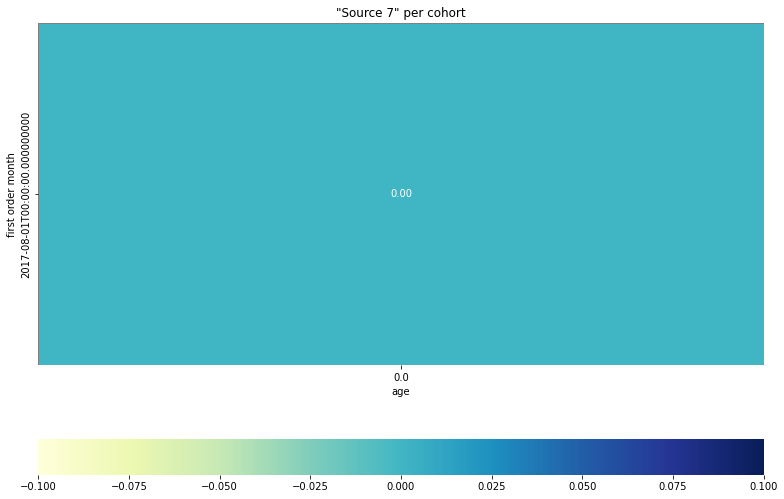

In [326]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s7, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'}, cmap="YlGnBu" 
            ).set(title ='"Source 7" per cohort')
plt.show()

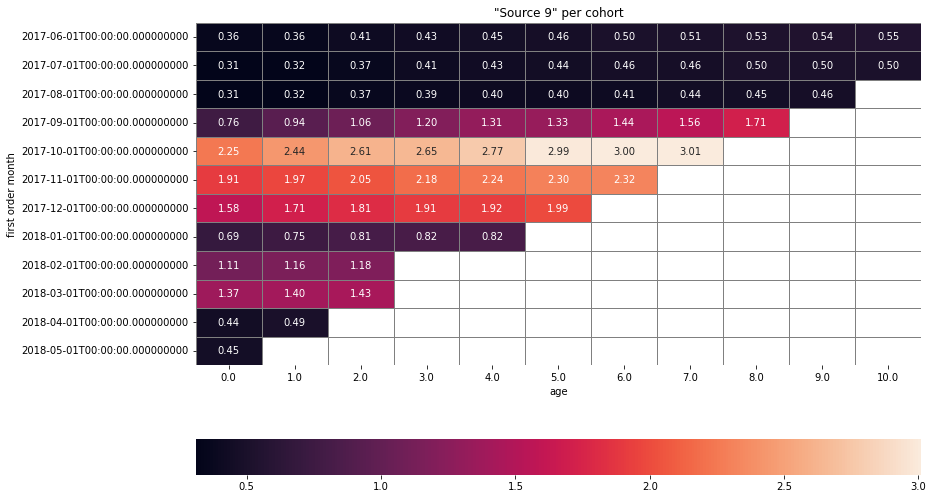

In [327]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s9, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            ).set(title ='"Source 9" per cohort')
plt.show()

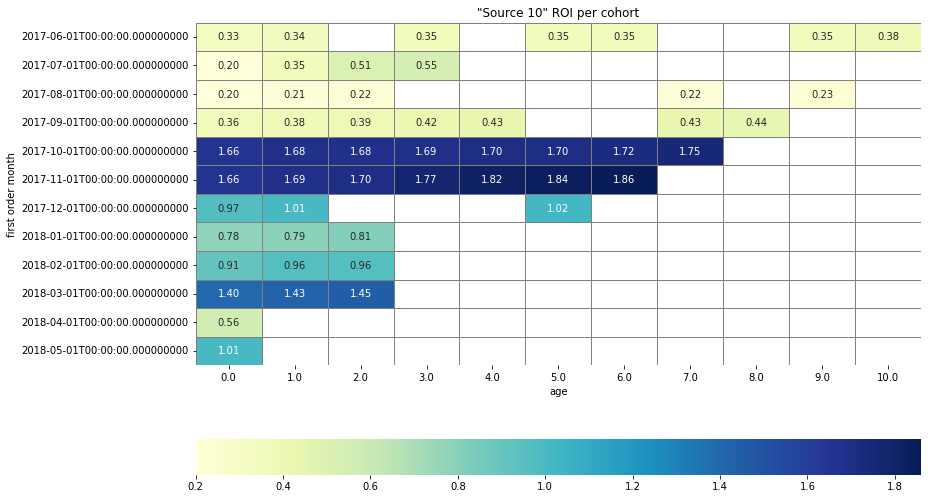

In [328]:
plt.figure(figsize=(13, 9))# Set the figure size

sns.heatmap(s10, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'}, cmap="YlGnBu" 
            ).set(title ='"Source 10" ROI per cohort')
plt.show()

# Conclusion #

***Although Yandex Afisha spends the most money on "Source 3"; nevertheless, "Source 1" and "Source 2" have the highest return on money invested. 36898 users made a purchase with a month of their initial visit. The third quartile duration is one month with 3083 users. Furthermore, 1512 users completed their purchases between 2-6 months, and 2309 users took 7-11 months.  The overall conversion rate is 79.4%.*** 

***Users tend to access "Yandex.Afisha" through their desktops/portable devices by a ratio 1.5-3:1, and make purchases in accordance with this ratio.***

***June 11, 2017 - July 17, 2017 is typified by an uptrend which peaks with 1138 users on July 17, whereupon the activity pulls back to 281 users until August 13th. This may correspond with peak vacation season when people tend to travel, which likely obviates the need to use the "Afisha" platform for movie tickets and other recreational events, and can explain the precipitous decline in demand during this period. Subsequently, the next wave peaks at 1418 users on October 6, 2017, enters a sideways trend, and there is an anomolous breakout in usage on November 24, when 3319 users accessed Afisha. The rationale behind such a surge in demand can be due to the thanksgiving holiday season, which is characterized by family-centered leisure activities, inter alia, going to the movies or concerts. Thereafter, the trend stabilizes and continues its sideways trend whereby the upper and lower bounds range from about 900 to 1500 users per day. On March 27th - 31, usage sharply declines and bottoms out with 1 user. Finally, during the second querter of 2018 Afisha usage ranges from 500 - 900, with surge of 1997 users on May 31, 2018. For the foregoing reasons, "Afisha" should focus on the desktop versions of "Source 1" and "Source 2," with due regard to the seasonality of consumer behavior.***

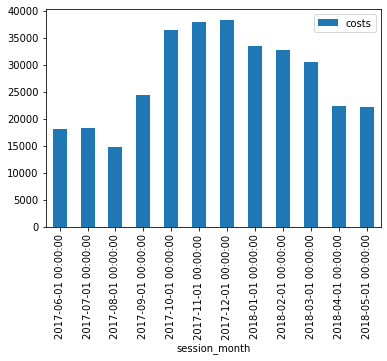

In [329]:
marketing_by_month.plot(kind='bar', x='session_month', y='costs')
plt.show()